In [1]:
import warnings

warnings.filterwarnings("ignore")
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# libaries to help with data visualization
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Libraries to tune model, get different metric scores, and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler, TomekLinks, ClusterCentroids
from imblearn.combine import SMOTETomek

from sklearn.impute import KNNImputer
from sklearn.pipeline import Pipeline, make_pipeline

#libraries to help with model building
from sklearn.linear_model import LogisticRegression, RidgeClassifier, RidgeClassifierCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier)
from xgboost import XGBClassifier

In [2]:
data = pd.read_csv("BankChurners.csv")
df = data.copy()

# Initial Look at Data

In [3]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,709444983,Attrited Customer,38,F,3,Uneducated,Single,$40K - $60K,Blue,30,...,2,3,2435.0,2432,3.0,0.120,1460,32,0.103,0.999
1,715847058,Attrited Customer,59,F,2,Uneducated,Divorced,Less than $40K,Blue,36,...,3,3,1863.0,1853,10.0,0.829,2462,40,0.290,0.995
2,816476658,Attrited Customer,54,F,2,Unknown,Married,Unknown,Blue,49,...,4,3,1812.0,1798,14.0,0.735,2921,44,0.692,0.992
3,789777408,Attrited Customer,26,F,0,Post-Graduate,Single,Less than $40K,Blue,15,...,2,3,1442.0,1428,14.0,0.496,1134,26,0.238,0.990
4,778885158,Existing Customer,57,M,3,Uneducated,Married,$80K - $120K,Blue,38,...,3,3,2472.0,2457,15.0,0.693,1392,33,0.737,0.994


In [4]:
df.shape # There are 10,127 rows and 21 columns.

(10127, 21)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

There are no missing values. We will proceed with investigating the data.
# Data Preprocessing

In [6]:
df.describe(include="all")

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,1.012700e+04,10127,10127.000000,10127,10127.000000,10127,10127,10127,10127,10127.000000,...,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
unique,NaN,2,NaN,2,NaN,7,4,6,4,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Existing Customer,NaN,F,NaN,Graduate,Married,Less than $40K,Blue,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,8500,NaN,5358,NaN,3128,4687,3561,9436,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,7.391776e+08,NaN,46.325960,NaN,2.346203,NaN,NaN,NaN,NaN,35.928409,...,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894
std,3.690378e+07,NaN,8.016814,NaN,1.298908,NaN,NaN,NaN,NaN,7.986416,...,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691
min,7.080821e+08,NaN,26.000000,NaN,0.000000,NaN,NaN,NaN,NaN,13.000000,...,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,7.130368e+08,NaN,41.000000,NaN,1.000000,NaN,NaN,NaN,NaN,31.000000,...,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000
50%,7.179264e+08,NaN,46.000000,NaN,2.000000,NaN,NaN,NaN,NaN,36.000000,...,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000
75%,7.731435e+08,NaN,52.000000,NaN,3.000000,NaN,NaN,NaN,NaN,40.000000,...,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000


In [7]:
pd.DataFrame({column:df[column].nunique() for column in df.columns},index=["Unique Values"]).T

,Unique Values
CLIENTNUM,10127
Attrition_Flag,2
Customer_Age,45
Gender,2
Dependent_count,6
Education_Level,7
Marital_Status,4
Income_Category,6
Card_Category,4
Months_on_book,44


CLIENTNUM is not a useful variable, so I will drop it.

In [8]:
df.drop(columns=["CLIENTNUM"],inplace=True)

## Encoding Variables

In [9]:
for c in df.columns:
    if df[c].dtype == "O":
        df[c] = df[c].astype("category")

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Attrition_Flag            10127 non-null  category
 1   Customer_Age              10127 non-null  int64   
 2   Gender                    10127 non-null  category
 3   Dependent_count           10127 non-null  int64   
 4   Education_Level           10127 non-null  category
 5   Marital_Status            10127 non-null  category
 6   Income_Category           10127 non-null  category
 7   Card_Category             10127 non-null  category
 8   Months_on_book            10127 non-null  int64   
 9   Total_Relationship_Count  10127 non-null  int64   
 10  Months_Inactive_12_mon    10127 non-null  int64   
 11  Contacts_Count_12_mon     10127 non-null  int64   
 12  Credit_Limit              10127 non-null  float64 
 13  Total_Revolving_Bal       10127 non-null  int6

# Exploratory Data Analysis
## Univariate Analysis
### Numerical Variables

In [11]:
def histogram_boxplot(feature, figsize=(15,10), bins = None): #Code copied from Uber Case Study notes.
    f2, (ax_box2, ax_hist2) = plt.subplots(nrows = 2,
                                           sharex = True,
                                           gridspec_kw = {"height_ratios": (.25, .75)}, 
                                           figsize = figsize 
                                           )
    sns.boxplot(feature, ax=ax_box2, showmeans=True, color='red')
    sns.distplot(feature, kde=False, ax=ax_hist2, bins=bins) if bins else sns.distplot(feature, kde=False, ax=ax_hist2)
    ax_hist2.axvline(np.mean(feature), color='g', linestyle='--')
    ax_hist2.axvline(np.median(feature), color='black', linestyle='-')

In [12]:
numvars = [var for var in df.columns if (df[var].dtype in ["int64","float64"])]

In [13]:
df.loc[:,numvars].describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000


#### Customer_Age

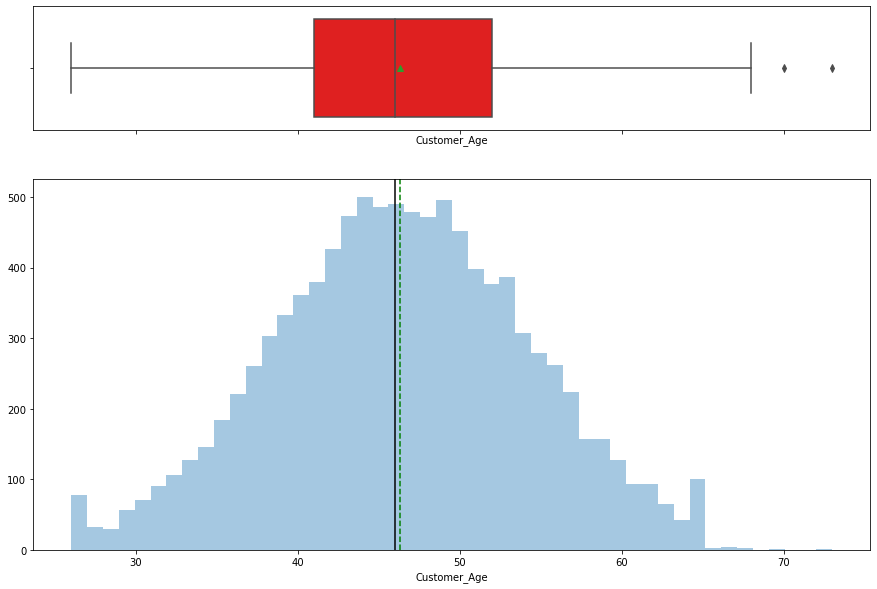

In [14]:
histogram_boxplot(df.Customer_Age,bins=48)

**Observations**
* Ages range from 26-73 with a median of 46 years.
* The distribution of age is very close to normal, except for small peaks at 26 and 65.
* There are two outliers: 70 and 73.

#### Dependent_count

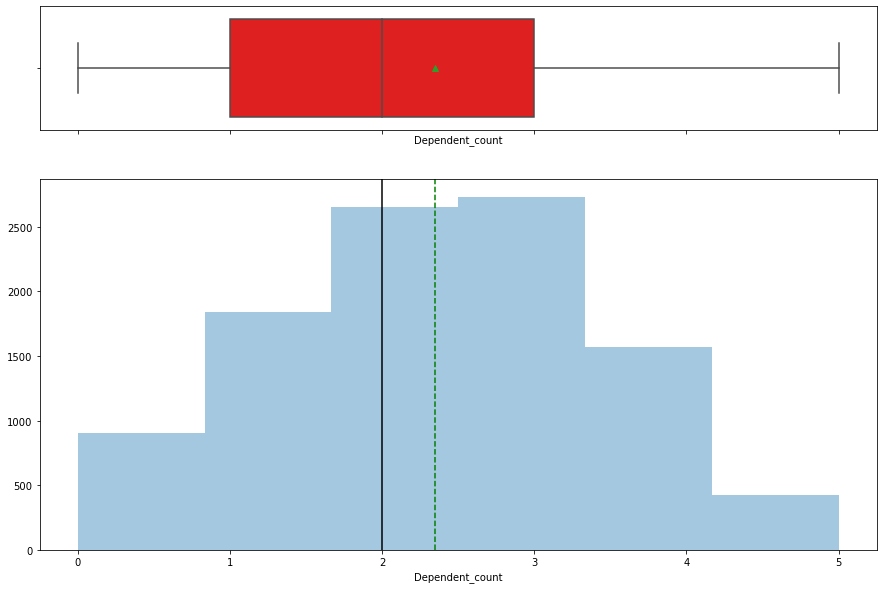

In [15]:
histogram_boxplot(df.Dependent_count,bins=6)

**Observations**
* Number of dependents ranges from 0 to 5 with a median of 2 and mean 2.35.
* Distribution looks fairly close to a normal around a mean of 2.5.
    * However, there is a right skew to the data despite a mode of 3.
* There are no outliers.

#### Months_on_book

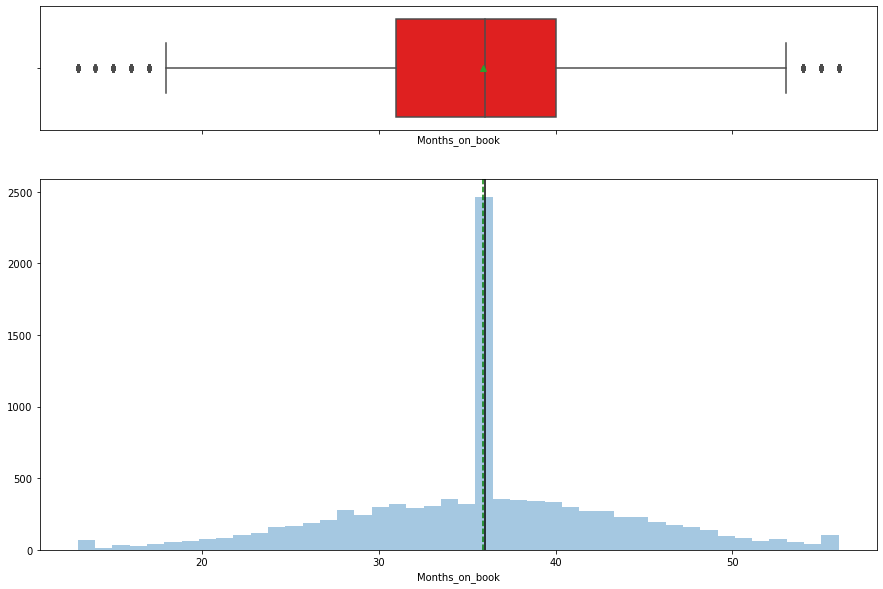

In [16]:
histogram_boxplot(df.Months_on_book,bins=44)

**Observations**
* Ranges from 13 to 56 months with mean and median of 36 months.
* Distribution looks somewhat normal, except for the mode of 36 which is much more frequent than any other number of months on book.
    * Did something happen that caused a lot of customers to join the bank 36 months ago? This is worth investigating.
* There are small peaks at 13 and 56 months.
* There are a few outliers on both sides.

#### Total_Relationship_Count

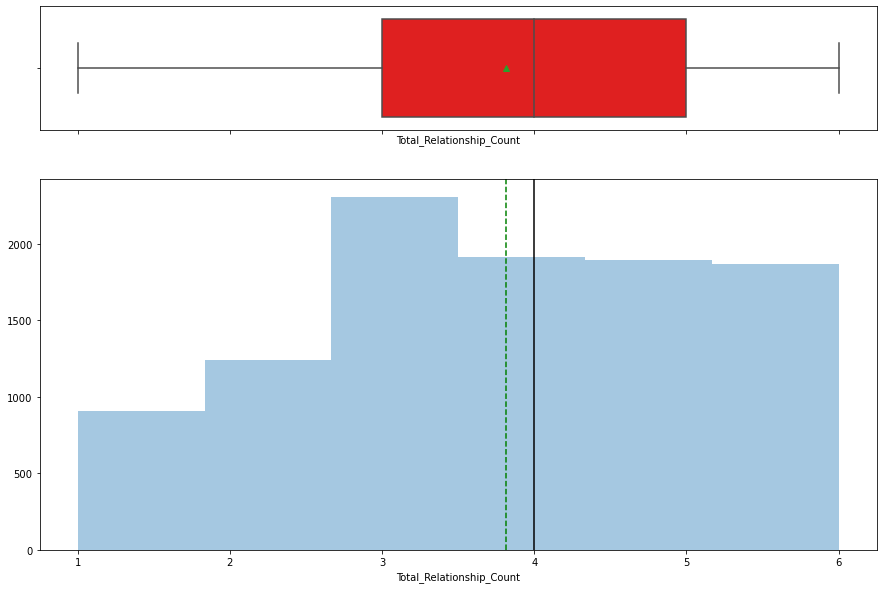

In [17]:
histogram_boxplot(df.Total_Relationship_Count,bins=6)

**Observations**
* Ranges from 1 to 6 products with a median of 4 products and mean of 3.81.
* More customers buy a larger number of products until the mode of 3, then the number of customers with 4 products is less, and the number of customers with 5 or 6 products is almost equal to those with 4 products.
* There are no outliers.

#### Months_Inactive_12_mon

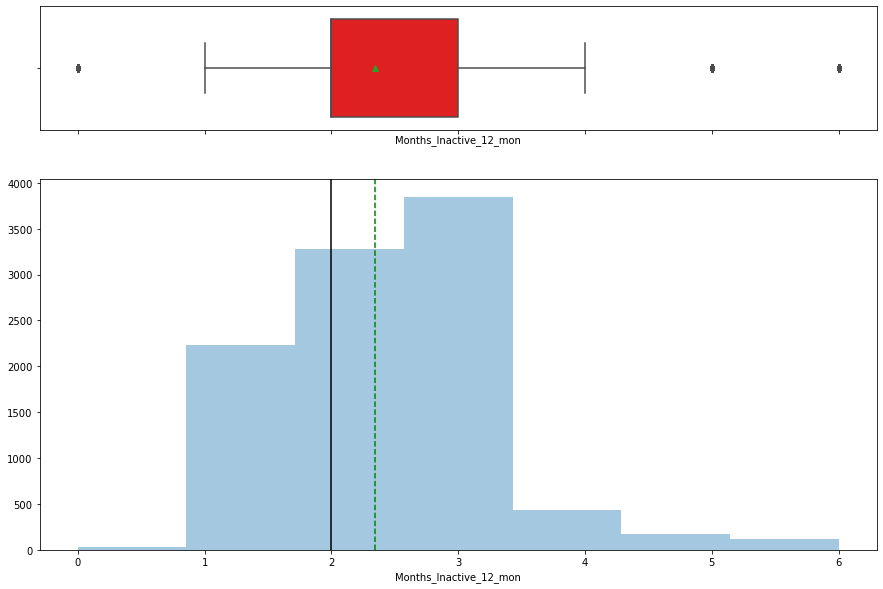

In [18]:
histogram_boxplot(df.Months_Inactive_12_mon,bins=7)

**Observations**
* Ranges from 0 to 6 months inactive in the last year with a median of 2 months.
* Data is right skewed.
* The vast majority of customers were inactive for 1-3 months in the past year.
* Almost no customers were active for all 12 months in the past year.
* There are some outliers present.

#### Contacts_Count_12_mon

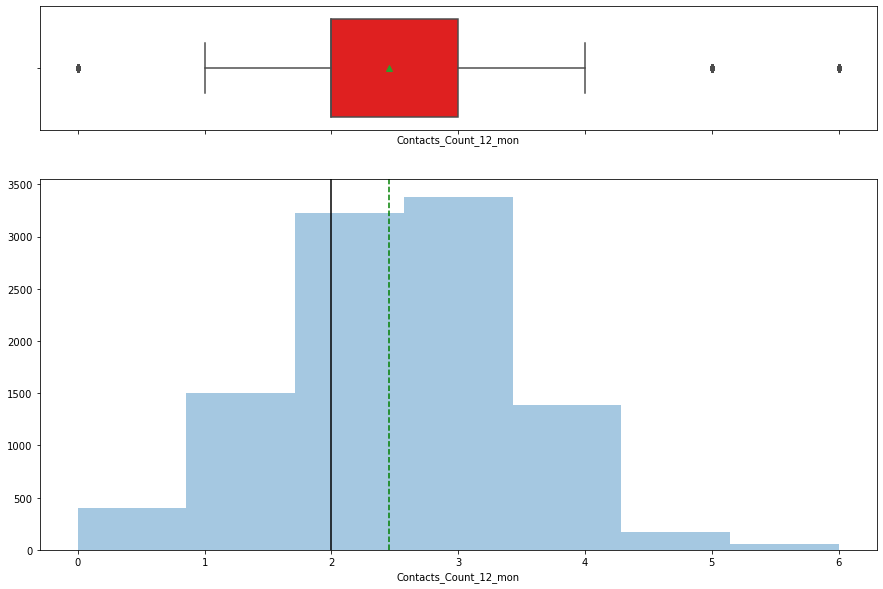

In [19]:
histogram_boxplot(df.Contacts_Count_12_mon,bins=7)

**Observations**
* Ranges from 0 to 6 contacts with a median of 2 and mean 2.34.
* Data is right skewed.
* Most customers had either 2 or 3 contacts in the last 12 months. The amount of customers decreases sharply as the number of contacts gets farther away from 2 and 3.
* Some outliers are present.

#### Credit_Limit

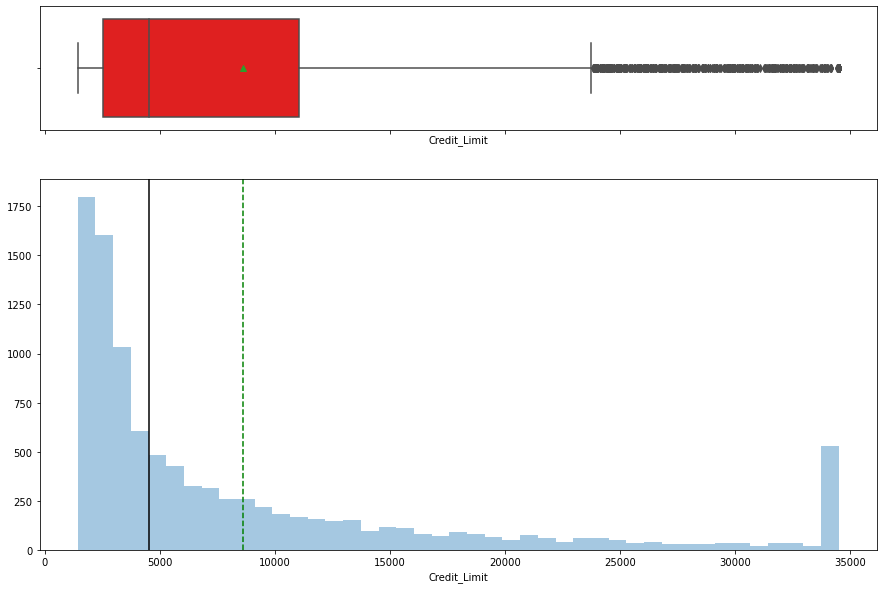

In [20]:
histogram_boxplot(df.Credit_Limit)

**Observations**
* Ranges from 1,438.30 to 34,516.00 with a median of 4,549.00 and average of 8,631.95.
* Data is right skewed with many outliers on the far side.
* There is a peak at the maximum value of 35,516.
    * Perhaps this is the maximum credit limit Thera Bank will allow.

#### Total_Revolving_Bal

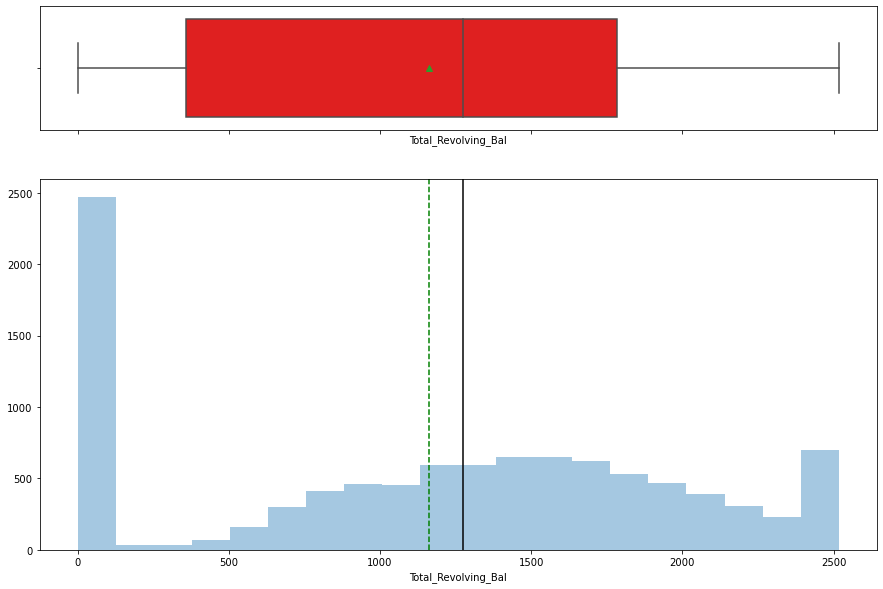

In [21]:
histogram_boxplot(df.Total_Revolving_Bal)

**Observations**
* Ranges from 0 to 2,517 with a median of 1,276 and mean of 1,162.81.
* Data is left skewed with no outliers.
* There are peaks at 0, 2,517, and somewhere around 1,500.
    * More customers have 0 revolving balance than any other amount.

#### Avg_Open_To_Buy

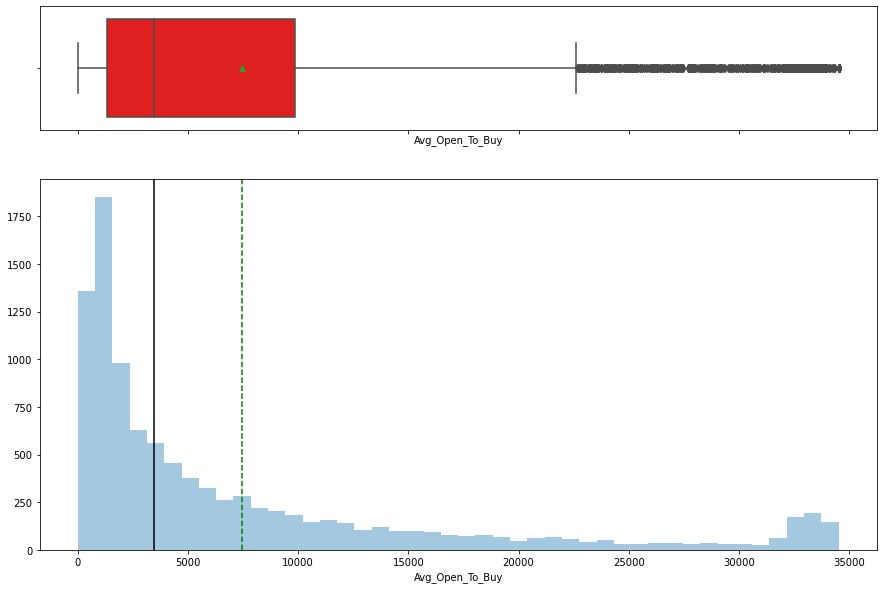

In [22]:
histogram_boxplot(df.Avg_Open_To_Buy)

**Observations**
* Ranges from 3 to 34,516 with a median of 3,474 and mean of 7,469.14.
* Very right skewed with many outliers on the far end.
* There is a jump in the frequency of values from about 31,000 to our max value of 34,516.
    * This is likely related to the peak of customers with the max credit limit of 34,516 as seen earlier.
* **This variable is just Credit_Limit - Total_Revolving_Bal. It provides no new information, so I will remove it.**

In [23]:
df.pop("Avg_Open_To_Buy")
numvars.remove("Avg_Open_To_Buy")

#### Total_Amt_Chng_Q4_Q1

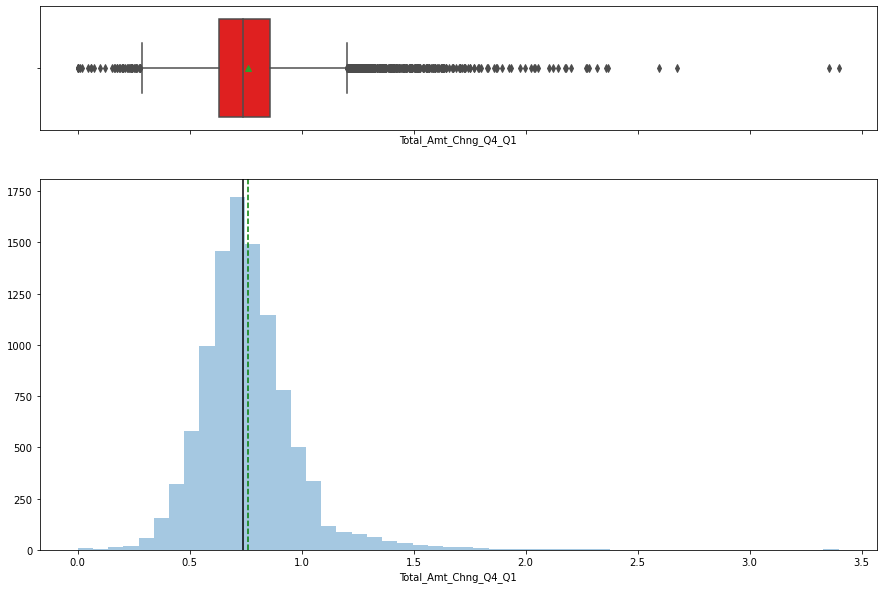

In [24]:
histogram_boxplot(df.Total_Amt_Chng_Q4_Q1)

**Observations**
* Ranges from 0 to 3.397 with a median of 0.736 and mean of 0.760.
    * This means that the average transaction amount has decreased from quarter 1 to quarter 4.
* Distribution seems close to normal with outliers on both sides.
    * There are more extreme outliers on the far side.

#### Total_Trans_Amt

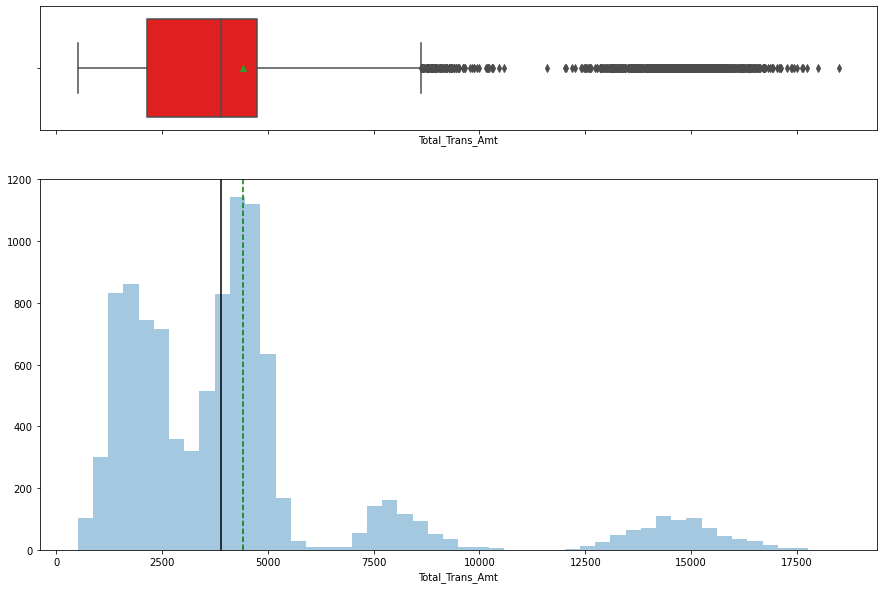

In [25]:
histogram_boxplot(df.Total_Trans_Amt)

**Observations**
* Ranges from 510 to 18,484 with a median of 3,899 and mean of 4,404.09.
* There are many extreme outliers on the far end.
* **There appears to be 4 different distributions in this graph. We will investigate this further.**

#### Total_Trans_Ct

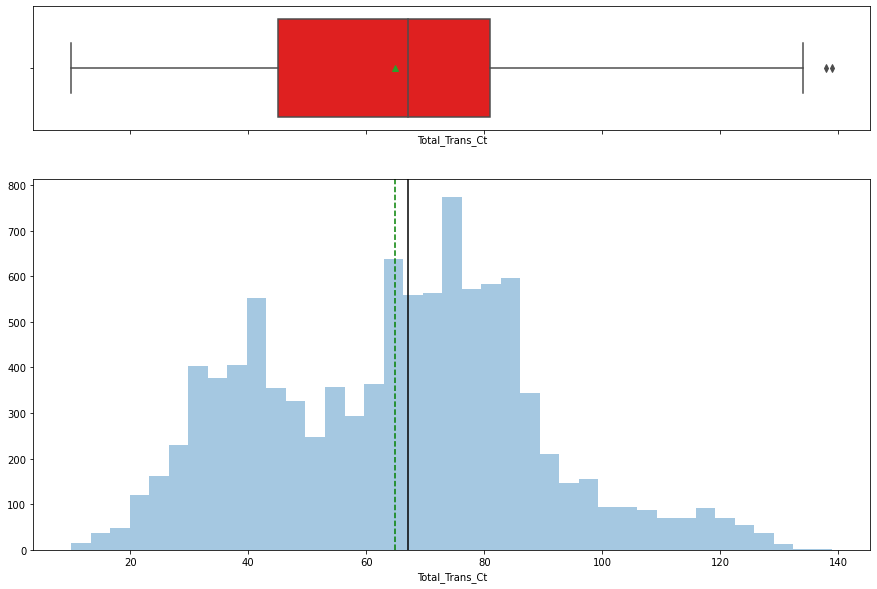

In [26]:
histogram_boxplot(df.Total_Trans_Ct)

**Observations**
* Ranges from 10 to 139 with a median of 67 and mean of 64.89.
* There is only a small amount of outliers.
* There seems to be 2-3 distributions in this plot. This will be investigated further.
    * This is likely because total transaction count and total transaction amount are related.

#### Total_Ct_Chng_Q4_Q1

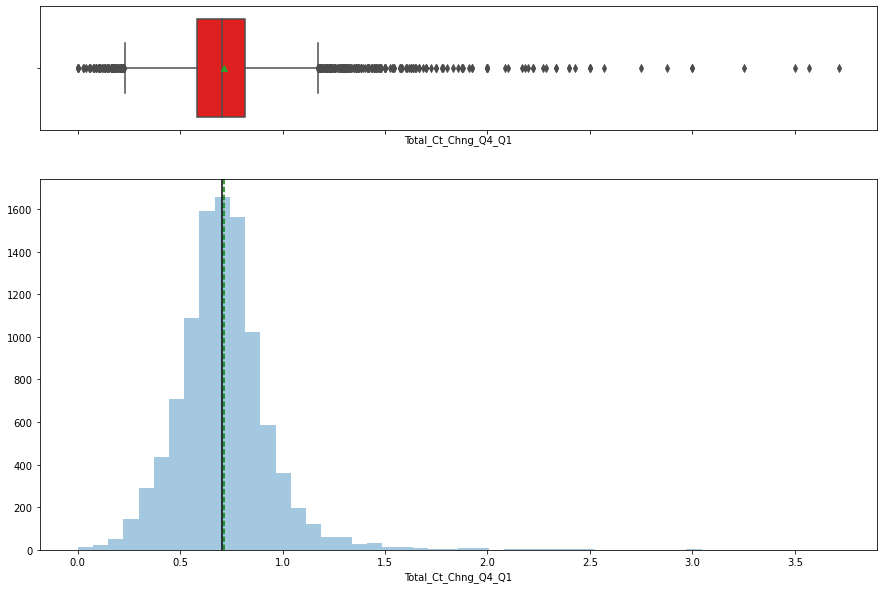

In [27]:
histogram_boxplot(df.Total_Ct_Chng_Q4_Q1)

**Observations**
* Ranges from 0 to 3.714 with median of 0.702 and mean of 0.712.
    * This means that the average number of transactions has decreased from quarter 1 to quarter 4.
* Distribution seems close to normal with outliers on both sides.
    * There are more extreme outliers on the far side.

#### Avg_Utilization_Ratio

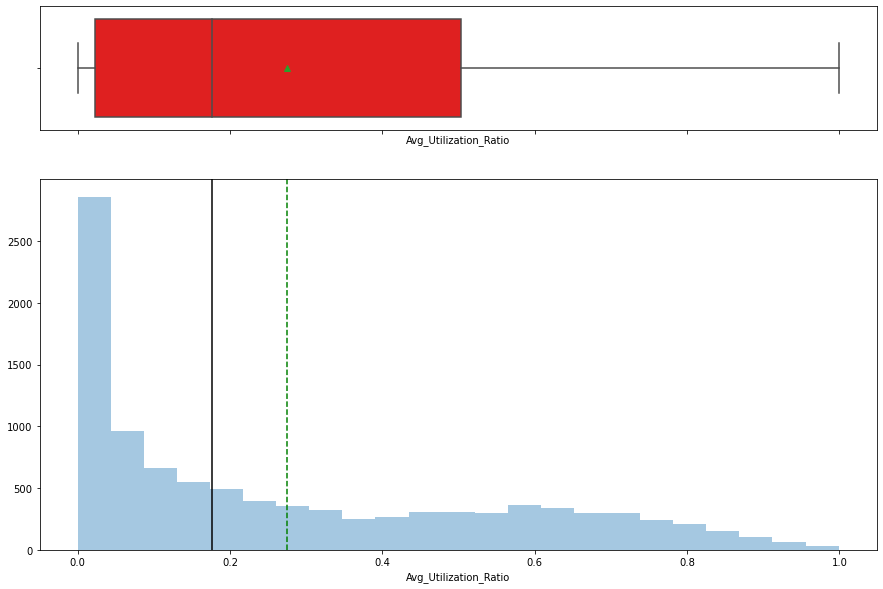

In [28]:
histogram_boxplot(df.Avg_Utilization_Ratio)

**Observations**
* Ranges from 0 to 0.999 with a median of 0.176 and mean of 0.275.
* Data is right skewed with no outliers.
* Possibly a combination of 2 distributions because of the peak around 0.6.
* **This variable is just Total_Revolving_Bal divided by Credit_Limit. It provides no new information, so it will be removed.**

In [29]:
df.pop("Avg_Utilization_Ratio")
numvars.remove("Avg_Utilization_Ratio")

### Categorical Variables

In [30]:
def bar_perc(plot, feature): #Taken from the Uber Case study lecture to analyze categorical variables.
    total = len(feature)
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)

In [31]:
catvars = [var for var in df.columns if (df[var].dtype not in ["int64","float64"])]

In [32]:
CatVarsdf = df.loc[:,catvars].astype("category")
CatVarsdf.describe()

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
count,10127,10127,10127,10127,10127,10127
unique,2,2,7,4,6,4
top,Existing Customer,F,Graduate,Married,Less than $40K,Blue
freq,8500,5358,3128,4687,3561,9436


#### Attrition_Flag

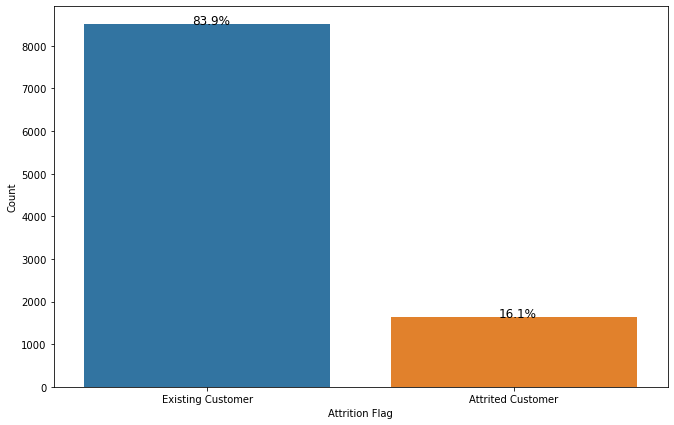

In [33]:
plt.figure(figsize=(11,7))
ax = sns.countplot(df.Attrition_Flag,order=df.Attrition_Flag.value_counts().index)
plt.xlabel('Attrition Flag')
plt.ylabel('Count')
bar_perc(ax,df.Attrition_Flag)

**Observation**
* 16.1% of customers have attritted.

#### Gender

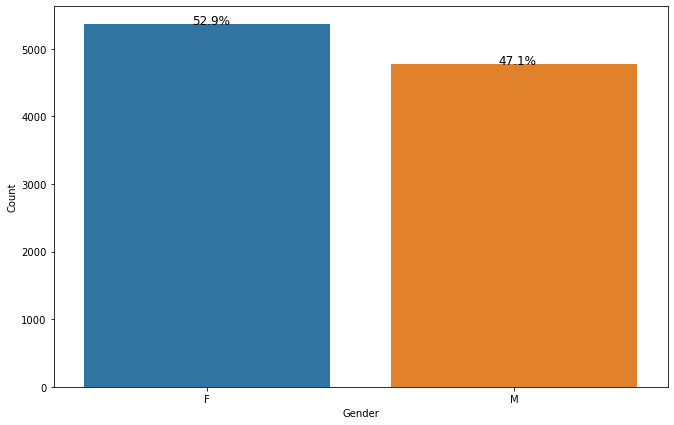

In [34]:
plt.figure(figsize=(11,7))
ax = sns.countplot(df.Gender,order=df.Gender.value_counts().index)
plt.xlabel('Gender')
plt.ylabel('Count')
bar_perc(ax,df.Gender)

**Observation**
* Slightly more customers are female (52.9%) than male (47.1%).

#### Education_Level

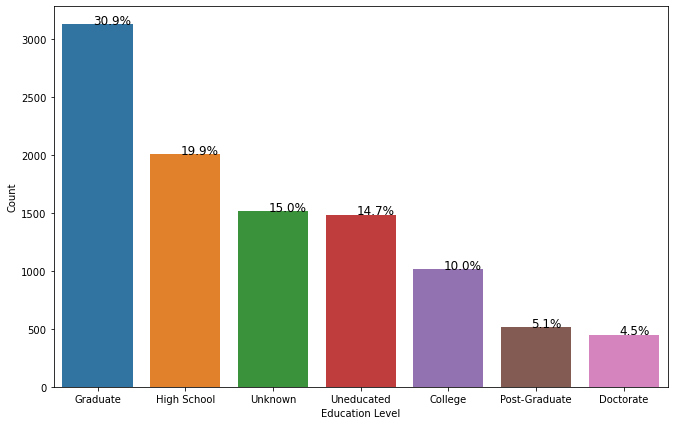

In [35]:
plt.figure(figsize=(11,7))
ax = sns.countplot(df.Education_Level,order=df.Education_Level.value_counts().index)
plt.xlabel('Education Level')
plt.ylabel('Count')
bar_perc(ax,df.Education_Level)

**Observations**
* Education level is not uniformly distributed.
* Many more customers are Graduates than any other group.
* After this, it is generally less common for customers to be more educated.
* Fifteen percent of customers have unknown education level.

#### Marital_Status

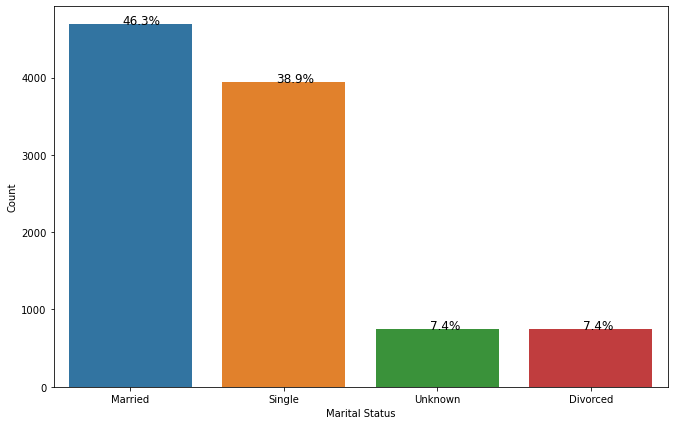

In [36]:
plt.figure(figsize=(11,7))
ax = sns.countplot(df.Marital_Status,order=df.Marital_Status.value_counts().index)
plt.xlabel('Marital Status')
plt.ylabel('Count')
bar_perc(ax,df.Marital_Status)

**Observations**
* Almost half (46.3%) of the customers are married.
* Over a third (38.9%) of customers are single.
* 7.4% of customers are divorced.
* 7.4% of customers have unknown marital status.

#### Income_Category

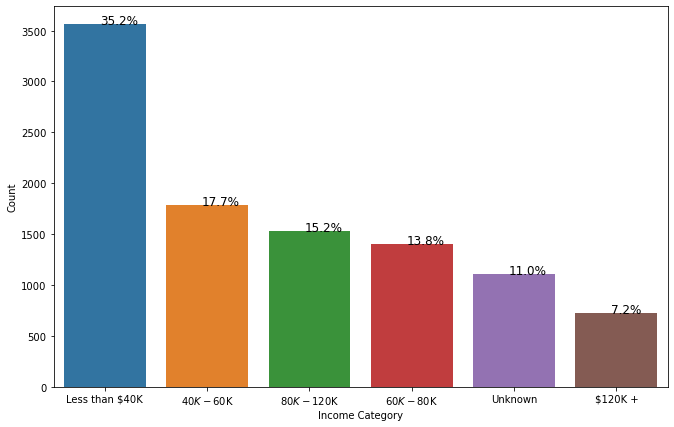

In [37]:
plt.figure(figsize=(11,7))
ax = sns.countplot(df.Income_Category,order=df.Income_Category.value_counts().index)
plt.xlabel('Income Category')
plt.ylabel('Count')
bar_perc(ax,df.Income_Category)

**Observations**
* Customers are less likely to have a higher income.
* Over 1/3 (35.2%) of customers make less than 40 thousand dollars per year.
* 11.0% of customers have unknown income.

#### Card_Category

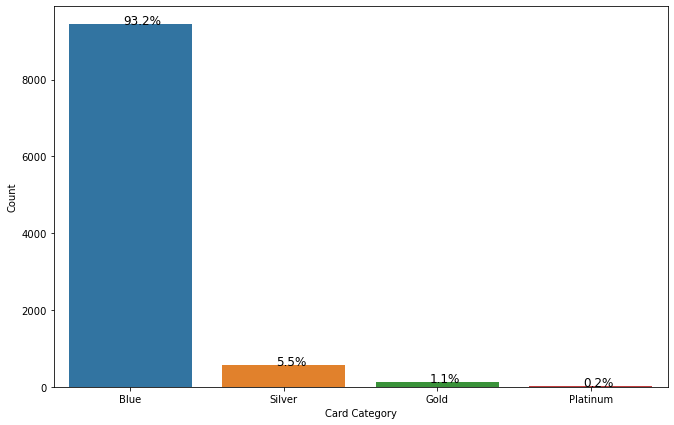

In [38]:
plt.figure(figsize=(11,7))
ax = sns.countplot(df.Card_Category,order=df.Card_Category.value_counts().index)
plt.xlabel('Card Category')
plt.ylabel('Count')
bar_perc(ax,df.Card_Category)

**Observations**
* The higher the category of card, the less likely the customer is to possess that card.
    * Almost all customers (93.2%) have a blue card.
    * Only 0.2% of customers have the platinum card.

## Bivariate Analysis
### Between Numerical Variables

In [39]:
numerical_df = df.loc[:,numvars]
corr = numerical_df.corr()
corr

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1
Customer_Age,1.000000,-0.122254,0.788912,-0.010931,0.054361,-0.018452,0.002476,0.014780,-0.062042,-0.046446,-0.067097,-0.012143
Dependent_count,-0.122254,1.000000,-0.103062,-0.039076,-0.010768,-0.040505,0.068065,-0.002688,-0.035439,0.025046,0.049912,0.011087
Months_on_book,0.788912,-0.103062,1.000000,-0.009203,0.074164,-0.010774,0.007507,0.008623,-0.048959,-0.038591,-0.049819,-0.014072
Total_Relationship_Count,-0.010931,-0.039076,-0.009203,1.000000,-0.003675,0.055203,-0.071386,0.013726,0.050119,-0.347229,-0.241891,0.040831
Months_Inactive_12_mon,0.054361,-0.010768,0.074164,-0.003675,1.000000,0.029493,-0.020394,-0.042210,-0.032247,-0.036982,-0.042787,-0.038989
Contacts_Count_12_mon,-0.018452,-0.040505,-0.010774,0.055203,0.029493,1.000000,0.020817,-0.053913,-0.024445,-0.112774,-0.152213,-0.094997
Credit_Limit,0.002476,0.068065,0.007507,-0.071386,-0.020394,0.020817,1.000000,0.042493,0.012813,0.171730,0.075927,-0.002020
Total_Revolving_Bal,0.014780,-0.002688,0.008623,0.013726,-0.042210,-0.053913,0.042493,1.000000,0.058174,0.064370,0.056060,0.089861
Total_Amt_Chng_Q4_Q1,-0.062042,-0.035439,-0.048959,0.050119,-0.032247,-0.024445,0.012813,0.058174,1.000000,0.039678,0.005469,0.384189
Total_Trans_Amt,-0.046446,0.025046,-0.038591,-0.347229,-0.036982,-0.112774,0.171730,0.064370,0.039678,1.000000,0.807192,0.085581


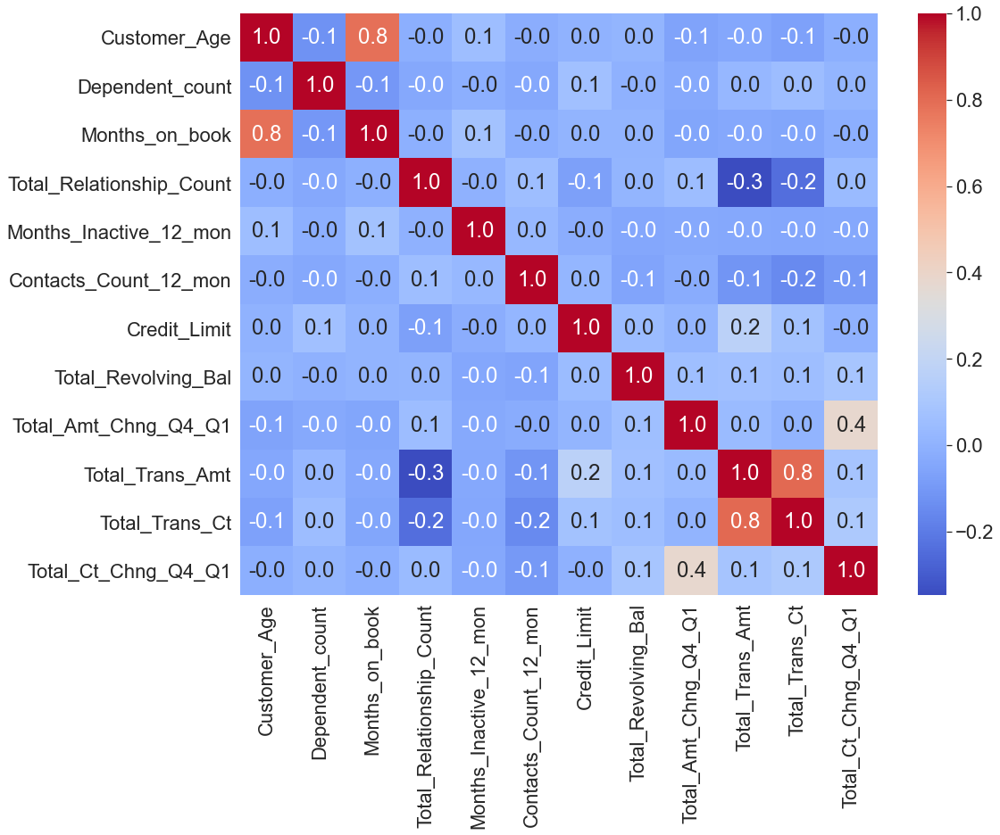

In [40]:
sns.set(font_scale=2)
plt.figure(figsize=(16,12))
sns.heatmap(corr, annot=True,cmap='coolwarm',
        fmt=".1f",
        xticklabels=corr.columns,
        yticklabels=corr.columns);
sns.set(font_scale=1)

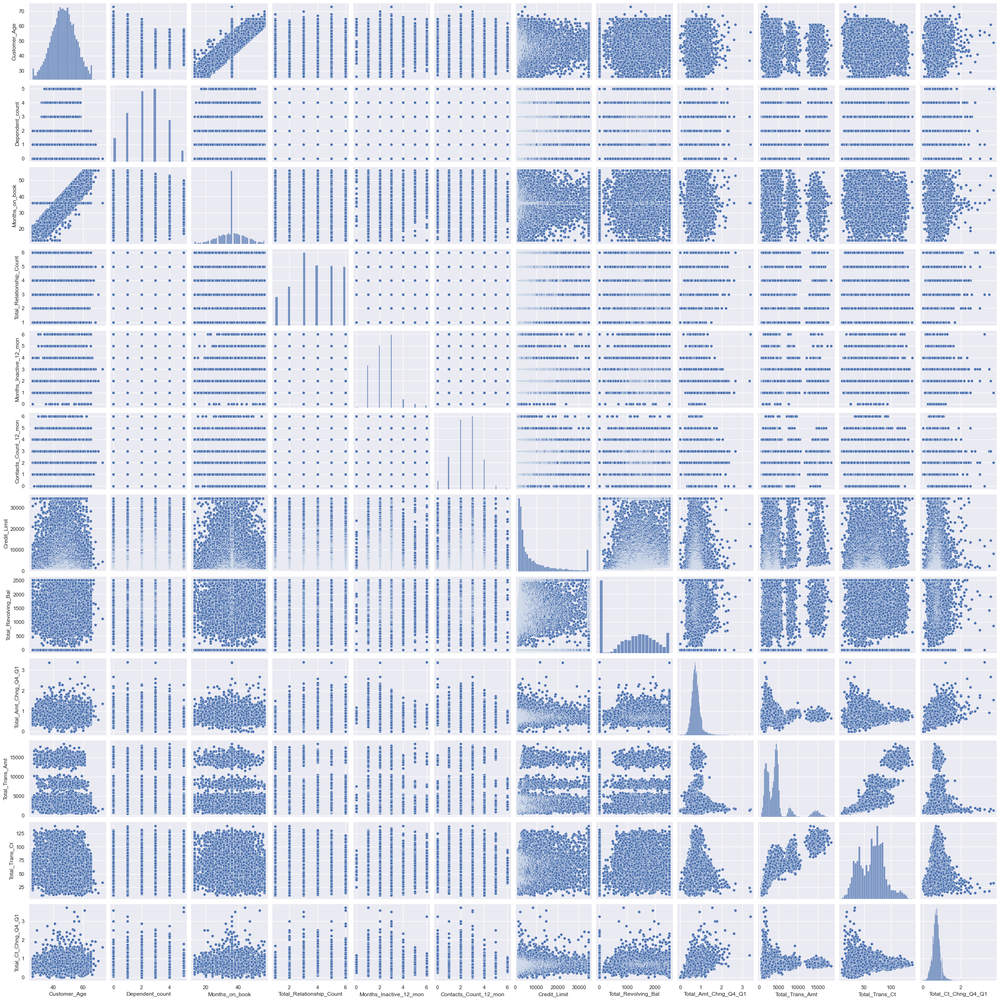

In [41]:
sns.pairplot(numerical_df);

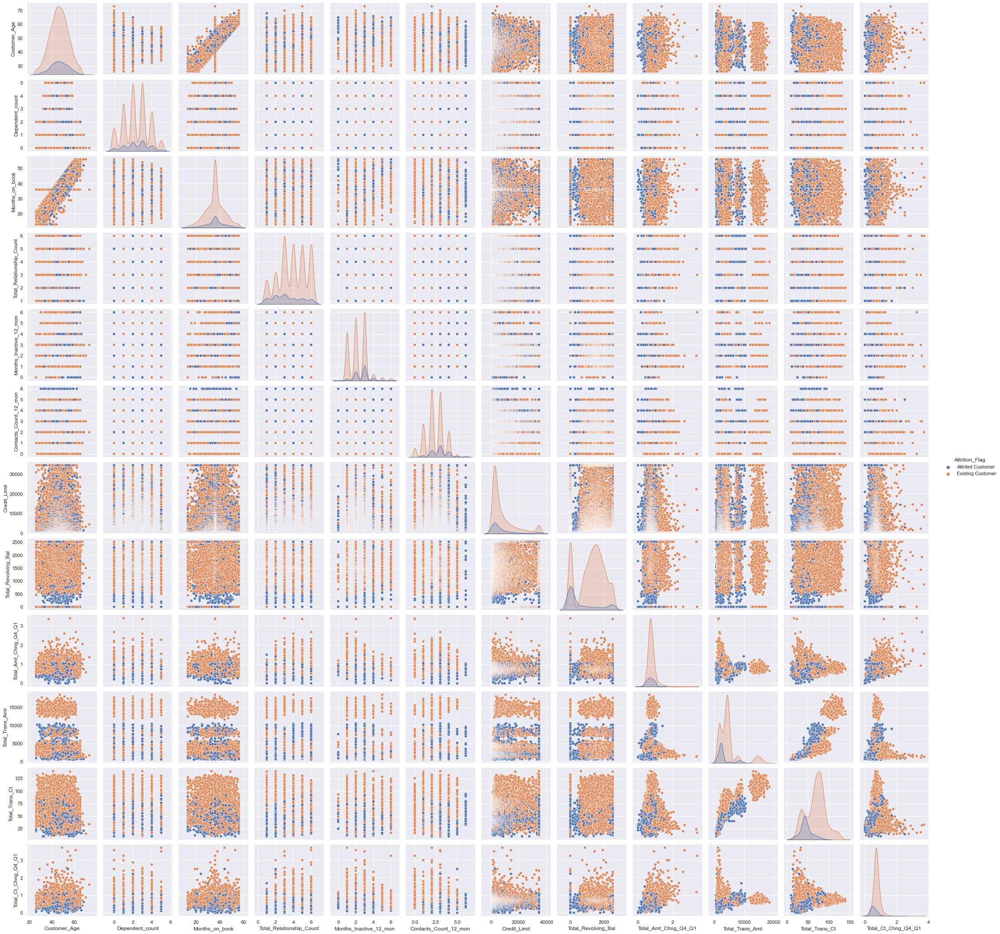

In [42]:
sns.pairplot(pd.concat([numerical_df,df.Attrition_Flag],axis=1),hue="Attrition_Flag");

**Observations**
* Customer_Age and Months_on_book have an unusually strong positive linear relationship.
    * The relationship is clear in the pairplot. Only where months_on_book = 36 is the relationship thrown off.
    * This must be investigated further.
* There is a very strong positive linear relationship between Total_Trans_Amt and Total_Trans_Ct.
* There is a weak (but existent) positive linear relationship between Total_Amt_Chng_Q4_Q1 and Total_Ct_Chng_Q4_Q1.
* **There are 3-4 mixed Gaussians in the Total_Trans_Amt variable and 2-3 mixed Gaussians in the Total_Trans_Ct variable.**
    * Pairplots for these variables have the data clearly grouped into different sections.
    * **The pairplot with the target variable (Attrition_Flag) as hue shows that these Gaussians are related to customer attrition.**

### Between Categorical Variables

In [43]:
def stacked_plot(x,stack): #Taken from PE-2 notebook.
    sns.set(palette='nipy_spectral')
    tab1 = pd.crosstab(x,df[stack],margins=True)
    print(tab1)
    print('-'*120)
    tab = pd.crosstab(x,df[stack],normalize='index')
    tab.plot(kind='bar',stacked=True,figsize=(10,5))
    #plt.legend(loc='lower left', frameon=False)
    #plt.legend(loc="upper left", bbox_to_anchor=(0,1))
    plt.show()

from itertools import combinations

def CatByCat(dataframe,catlist,length=25,targetvariable=False):
    ''' This function will take every combinations of 2 categorical variables from a dataframe
    and plot them against each other as x over y and y over x.
    It takes in a dataframe and a list of names of the columns that contain categorical variables.
    '''
    if targetvariable == False:
        combs = list(combinations(catlist,2)) #Generates list of all possible pairs of variables from the given list.
    else:
        combs = [[targetvariable,othervariable] for othervariable in catlist if othervariable != targetvariable]
    fig, axes = plt.subplots(len(combs), 2, figsize=(24, length*len(catlist))) #creates subplots
    for i in range(len(combs)): #goes through every pair from the data set and...
        tab = pd.crosstab(dataframe[combs[i][0]],dataframe[combs[i][1]],normalize='index')
        tab.plot(kind='bar',stacked=True,ax=axes[i][0])
        axes[i][0].set_title(combs[i][0]+" vs "+combs[i][1],size=20)
        tab = pd.crosstab(dataframe[combs[i][1]],dataframe[combs[i][0]],normalize='index')
        tab.plot(kind='bar',stacked=True,ax=axes[i][1])
        axes[i][1].set_title(combs[i][1]+" vs "+combs[i][0],size=20)

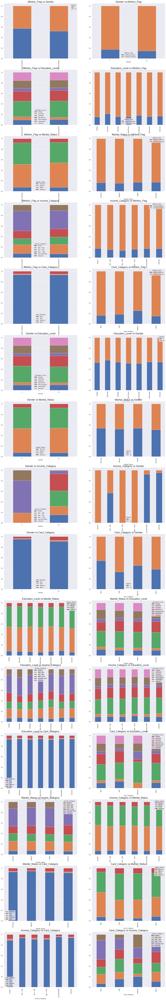

In [44]:
CatByCat(df,catvars)

**Observations**
* Customers with a higher card category have a higher likelihood of attrition.
    * The exception to this is that customers with the blue card are very slightly more likely to attrit than those with the silver card.
* Attrition_Flag's relationships with the other categorical variables are weaker, but still existent.
    * A slightly higher proportion of females attritted than males.
    * Customers with more education have a slightly higher attrition rate.
    * Single customers were slightly more likely to attrit than divorced or married customers.
    * Customers with income from 60K-80K were the least likely to attrit. As income increases or decreases from this amount, the likelihood of attrition increases.
* No females make more than 60K in a year, and very few men make less than 40K.
    * Exceptions to this could be in the unknown income, which is dominated by females.
* Female are less likely to own a card of a higher category, except for the Platinum card.
* No customers with the platinum card have the College level of education.
    * Also, a larger proportion of customers with the platinum card have a higher education level than college or are uneducated.
* Single customers are more likely to have a higher level card, whereas married and divorced customers are more likely to have a lower level card.
* Customers with higher income are more likely to own a higher level card.
    * Those who own the platinum card have a higher proportion of unknown income than any other card category.

### Between Numerical and Categorical Variables

In [45]:
def NumByCat(numericalvariable,catvars,dataframe=df): #Plots all combinations of 1 numerical variable and 1 categorical variable.
    fig, axes = plt.subplots(1, len(catvars), figsize=(60, 7.5))
    fig.suptitle(numericalvariable,size=30)
    for i in range(len(catvars)):
        sns.boxplot(dataframe[numericalvariable], dataframe[catvars[i].replace(" ","")], ax=axes[i], showmeans=True, palette="Set2", orient="h");
        axes[i].set_title(numericalvariable+" vs "+catvars[i],size=15)

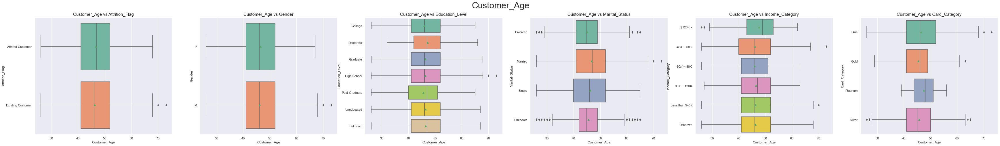

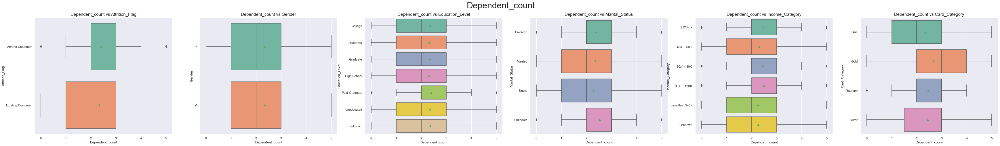

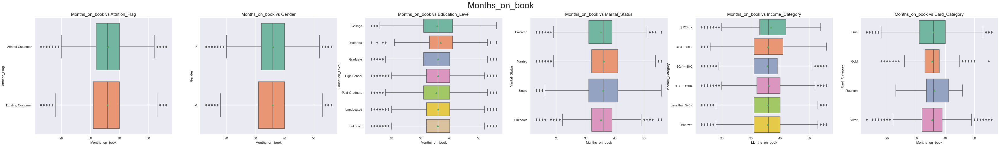

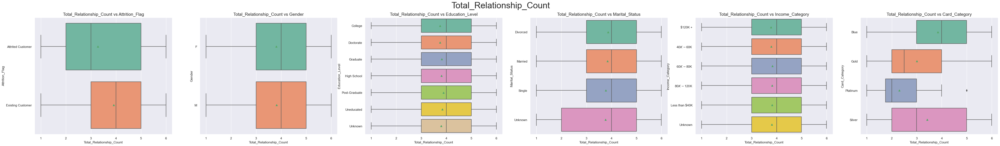

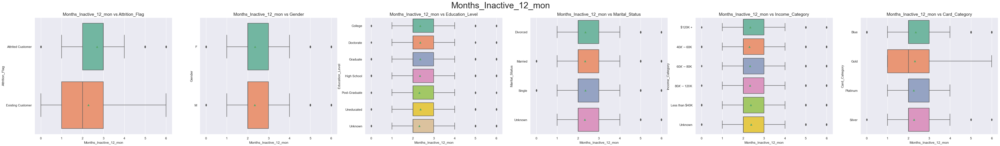

...

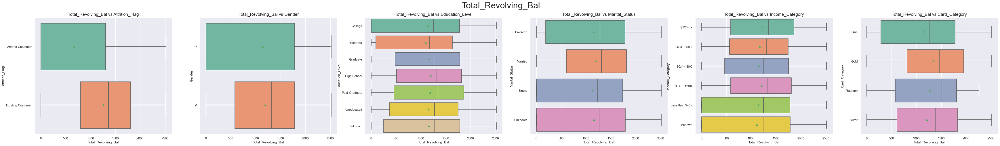

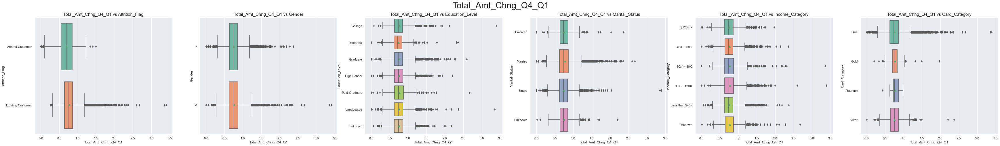

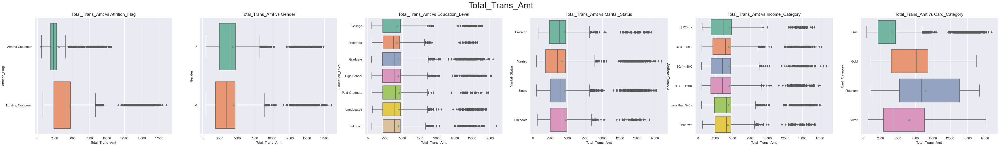

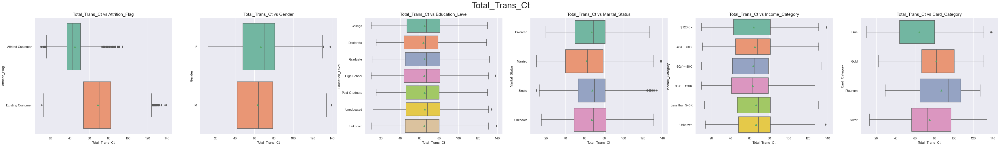

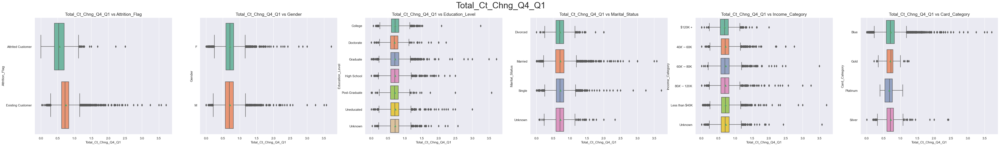

In [46]:
for numvar in numvars:
    NumByCat(numvar,catvars = catvars)

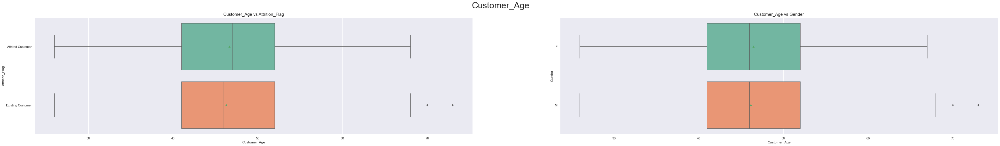

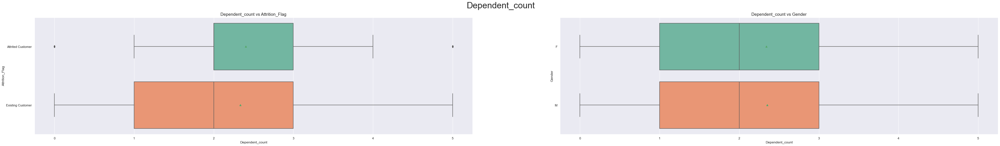

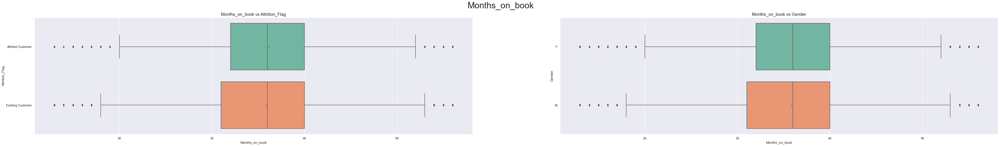

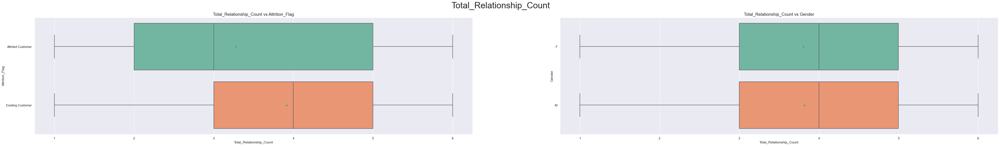

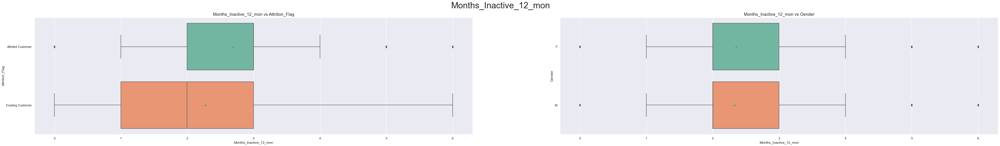

...

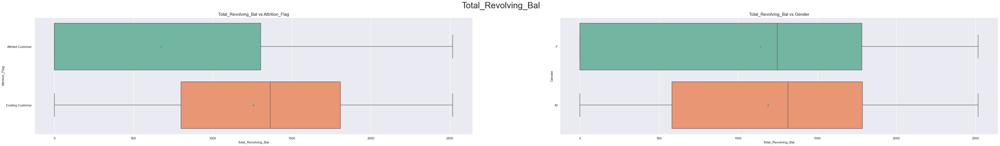

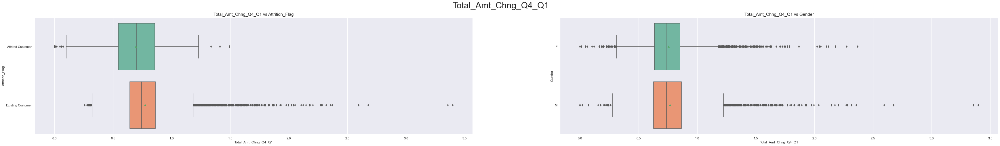

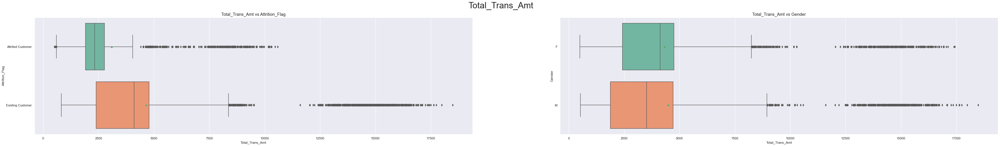

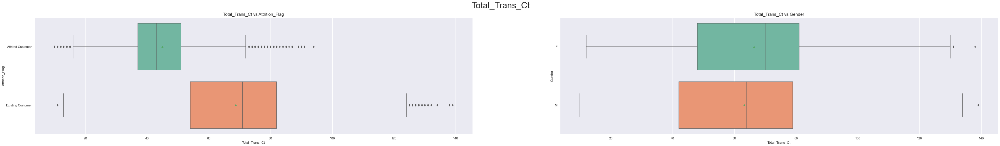

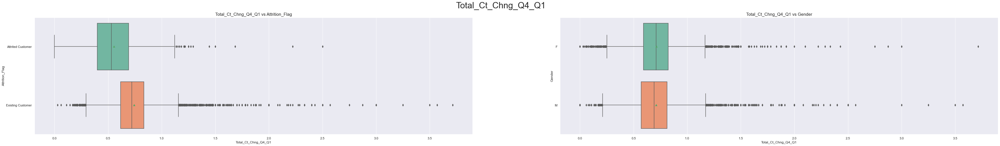

In [47]:
# This is done to more clearly compare Attrition_Flag to numerical variables (Ignore the Gender column).
for numvar in numvars:
    NumByCat(numvar,catvars = ["Attrition_Flag","Gender"])

**Observations**
* Customers who attritted...
    * hold a smaller total number of products than existing customers.
    * have a larger number of inactive months on average.
    * had a larger average number of contacts in the last year.
    * have a slightly smaller average credit limit.
    * have a much lower average revolving balance.
    * have a much lower average total transaction amount and count.
    * have a lower average change in transaction amount and count from Q1 to Q4.


* Those with a higher income have more dependents on average.
* Customers with a lower card category on average hold a higher number of products.
* Customers with a higher card category have a higher average total transaction amount and count.
* Credit_Limit is related to all categorical variables.
    * Males have a much higher average credit limit than females.
    * Those with more education have a slightly higher average credit limit.
        * The exception to this is those who are uneducated. They have the highest average credit limit of all.
    * Married customers have the lowest average credit limit, while those divorced or of unknown marital status have the highest average credit limits.
    * Those with more income have a much higher average credit limit.
    * Those with a higher level card category have a higher average credit limit.
        * The average credit limit for those with the clue card are much lower than that for those with other card types.

## Conclusions of EDA
### Summary
#### Univariate Analysis
Numerical Variables
* Age
    * Ages range from 26-73 with a median of 46 years.
    * The distribution of age is very close to normal, except for small peaks at 26 and 65.
    * There are two outliers: 70 and 73.
* Dependent_count
    * Number of dependents ranges from 0 to 5 with a median of 2 and mean 2.35.
    * Distribution looks fairly close to a normal around a mean of 2.5.
        * However, there is a right skew to the data despite a mode of 3.
    * There are no outliers.
* Months_on_book
    * Ranges from 13 to 56 months with mean and median of 36 months.
    * Distribution looks somewhat normal, except for the mode of 36 which is much more frequent than any other number of months on book.
        * Did something happen that caused a lot of customers to join the bank 36 months ago? This is worth investigating.
    * There are small peaks at 13 and 56 months.
    * There are a few outliers on both sides.
* Total_Relationship_Count
    * Ranges from 1 to 6 products with a median of 4 products and mean of 3.81.
    * More customers buy a larger number of products until the mode of 3, then the number of customers with 4 products is less, and the number of customers with 5 or 6 products is almost equal to those with 4 products.
    * There are no outliers.
* Months_Inactive_12_mon
    * Ranges from 0 to 6 months inactive in the last year with a median of 2 months.
    * Data is right skewed.
    * The vast majority of customers were inactive for 1-3 months in the past year.
    * Almost no customers were active for all 12 months in the past year.
    * There are some outliers present.
* Contacts_Count_12_mon
    * Ranges from 0 to 6 contacts with a median of 2 and mean 2.34.
    * Data is right skewed.
    * Most customers had either 2 or 3 contacts in the last 12 months. The amount of customers decreases sharply as the number of contacts gets farther away from 2 and 3.
    * Some outliers are present.
* Credit_Limit
    * Ranges from 1,438.30 to 34,516.00 with a median of 4,549.00 and average of 8,631.95.
    * Data is right skewed with many outliers on the far side.
    * There is a peak at the maximum value of 35,516.
        * Perhaps this is the maximum credit limit Thera Bank will allow.
* Total_Revolving_Bal
    * Ranges from 0 to 2,517 with a median of 1,276 and mean of 1,162.81.
    * Data is left skewed with no outliers.
    * There are peaks at 0, 2,517, and somewhere around 1,500.
        * More customers have 0 revolving balance than any other amount.
* Avg_Open_To_Buy
    * Ranges from 3 to 34,516 with a median of 3,474 and mean of 7,469.14.
    * Very right skewed with many outliers on the far end.
    * There is a jump in the frequency of values from about 31,000 to our max value of 34,516.
        * This is likely related to the peak of customers with the max credit limit of 34,516 as seen earlier.
    * **This variable is just Credit_Limit - Total_Revolving_Bal. It provides no new information, so it was removed.**
* Total_Amt_Chng_Q4_Q1
    * Ranges from 0 to 3.397 with a median of 0.736 and mean of 0.760.
        * This means that the average transaction amount has decreased from quarter 1 to quarter 4.
    * Distribution seems close to normal with outliers on both sides.
        * There are more extreme outliers on the far side.
* Total_Trans_Amt
    * Ranges from 510 to 18,484 with a median of 3,899 and mean of 4,404.09.
    * There are many extreme outliers on the far end.
    * **There appears to be 4 different distributions in this graph.**
* Total_Trans_Ct
    * Ranges from 10 to 139 with a median of 67 and mean of 64.89.
    * There is only a small amount of outliers.
    * There seems to be 2-3 distributions in this plot.
        * This is likely because total transaction count and total transaction amount are related.
* Total_Ct_Chng_Q4_Q1
    * Ranges from 0 to 3.714 with median of 0.702 and mean of 0.712.
        * This means that the average number of transactions has decreased from quarter 1 to quarter 4.
    * Distribution seems close to normal with outliers on both sides.
        * There are more extreme outliers on the far side.
* Avg_Utilization_Ratio
    * Ranges from 0 to 0.999 with a median of 0.176 and mean of 0.275.
    * Data is right skewed with no outliers.
    * Possibly a combination of 2 distributions because of the peak around 0.6.
    * **This variable is just Total_Revolving_Bal divided by Credit_Limit. It provides no new information, so was removed.**

Categorical Variables
* Attrition_Flag
    * 16.1% of customers have attritted.
* Gender
    * Slightly more customers are female (52.9%) than male (47.1%).
* Education_Level
    * Education level is not uniformly distributed.
    * Many more customers are Graduates than any other group.
    * After this, it is generally less common for customers to be more educated.
    * Fifteen percent of customers have unknown education level.
* Marital_Status
    * Almost half (46.3%) of the customers are married.
    * Over a third (38.9%) of customers are single.
    * 7.4% of customers are divorced.
    * 7.4% of customers have unknown marital status.
* Income_Category
    * Customers are less likely to have a higher income.
    * Over 1/3 (35.2%) of customers make less than 40 thousand dollars per year.
    * 11.0% of customers have unknown income.
* Card_Category
    * The higher the category of card, the less likely the customer is to possess that card.
        * Almost all customers (93.2%) have a blue card.
        * Only 0.2% of customers have the platinum card.


#### Bivariate Analysis
Between Numerical Variables
* Customer_Age and Months_on_book have an unusually strong positive linear relationship.
    * The relationship is clear in the pairplot. Only where months_on_book = 36 is the relationship thrown off.
    * This must be investigated further.
* There is a very strong positive linear relationship between Total_Trans_Amt and Total_Trans_Ct.
* There is a weak (but existent) positive linear relationship between Total_Amt_Chng_Q4_Q1 and Total_Ct_Chng_Q4_Q1.
* **There are 3-4 mixed Gaussians in the Total_Trans_Amt variable and 2-3 mixed Gaussians in the Total_Trans_Ct variable.**
    * Pairplots for these variables have the data clearly grouped into different sections.
    * **The pairplot with the target variable (Attrition_Flag) as hue shows that these Gaussians are related to customer attrition.**


Between Categorical Variables
* Customers with a higher card category have a higher likelihood of attrition.
    * The exception to this is that customers with the blue card are very slightly more likely to attrit than those with the silver card.
* Attrition_Flag's relationships with the other categorical variables are weaker, but still existent.
    * A slightly higher proportion of females attritted than males.
    * Customers with more education have a slightly higher attrition rate.
    * Single customers were slightly more likely to attrit than divorced or married customers.
    * Customers with income from 60K-80K were the least likely to attrit. As income increases or decreases from this amount, the likelihood of attrition increases.
* No females make more than 60K in a year, and very few men make less than 40K.
    * Exceptions to this could be in the unknown income, which is dominated by females.
* Female are less likely to own a card of a higher category, except for the Platinum card.
* No customers with the platinum card have the College level of education.
    * Also, a larger proportion of customers with the platinum card have a higher education level than college or are uneducated.
* Single customers are more likely to have a higher level card, whereas married and divorced customers are more likely to have a lower level card.
* Customers with higher income are more likely to own a higher level card.
    * Those who own the platinum card have a higher proportion of unknown income than any other card category.


Between Numerical and Categorical Variables
* Customers who attritted...
    * hold a smaller total number of products than existing customers.
    * have a larger number of inactive months on average.
    * had a larger average number of contacts in the last year.
    * have a slightly smaller average credit limit.
    * have a much lower average revolving balance.
    * have a much lower average total transaction amount and count.
    * have a lower average change in transaction amount and count from Q1 to Q4.
* Those with a higher income have more dependents on average.
* Customers with a lower card category on average hold a higher number of products.
* Customers with a higher card category have a higher average total transaction amount and count.
* Credit_Limit is related to all categorical variables.
    * Males have a much higher average credit limit than females.
    * Those with more education have a slightly higher average credit limit.
        * The exception to this is those who are uneducated. They have the highest average credit limit of all.
    * Married customers have the lowest average credit limit, while those divorced or of unknown marital status have the highest average credit limits.
    * Those with more income have a much higher average credit limit.
    * Those with a higher level card category have a higher average credit limit.
        * The average credit limit for those with the clue card are much lower than that for those with other card types.

### Insights
1. The relationships between Attrition_Flag and other variables are as follows:
    * Customers who attritted...
        * hold a smaller total number of products than existing customers.
        * have a larger number of inactive months on average.
        * had a larger average number of contacts in the last year.
        * have a slightly smaller average credit limit.
        * have a much lower average revolving balance.
        * have a much lower average total transaction amount and count.
        * have a lower average change in transaction amount and count from Q1 to Q4.
    * Customers with a higher card category have a higher likelihood of attrition.
        * The execption to this is that customers with the blue card are very slightly more likely to attrit than those with the silver card.
    * Attrition_Flag's relationships with the other categorical variables are weaker, but still existent.
        * A slightly higher proportion of females attritted than males.
        * Customers with more education have a slightly higher attrition rate.
        * Single customers were slightly more likely to attrit than divorced or married customers.
        * Customers with income from 60K-80K were the least likely to attrit. As income increases or decreases from this amount, the likelihood of attrition increases.


2. I would like to know more about how this dataset was handled.
    * Small bumps at the extreme values of some numerical variables such as Customer_Age and Total_Revolving_Bal suggest that outliers were capped at these values. Is this in fact the case?
    * Credit_Limit has a bump as well, but on only the far end. I would like to confirm that this is because Thera Bank does not provide credit greater than 34,516.


3. There is a strikingly large number of customers who have had a relationship for the bank for exactly 36 months.
    * Is this because of some sort of outreach, imputation of missing values as 36, or some other reason?


4. There are multiple distributions in the Total_Trans_Amt and Total_Trans_Ct variable histograms.
    * Bivariate analysis was not able to adequately explain this. Perhaps there is a missing variable from the dataset that could help separate the data into these different distributions.


5. Credit_Limit was related to all numerical variables. Are these variables used to determine credit limit?
    * If so, this variable might not be useful in model-building.

    
6. There is an unusually strong linear relationship between Customer_Age and Months_on_book.
    * A relationship between the two makes sense, but the pairplot between them is almost perfectly usual. This is worth investigating in further detail.


7. The average total amount and count of transactions have decreased over the past year, even among customers that have not attritted.
    * This is a concerning trend, and something Thera Bank must focus on changing.

# Data Pre-Processing
## One-Hot Encoding Variables

In [48]:
modeldf = df.copy()
modeldf.replace({"Existing Customer":0 ,"Attrited Customer": 1}, inplace=True)
modeldf = pd.get_dummies(modeldf, columns=modeldf.select_dtypes("category").columns, drop_first=True)
modeldf.head()

,Attrition_Flag,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,...,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,1,38,3,30,3,2,3,2435.0,2432,0.120,...,1,0,1,0,0,0,0,0,0,0
1,1,59,2,36,3,3,3,1863.0,1853,0.829,...,0,0,0,0,0,1,0,0,0,0
2,1,54,2,49,2,4,3,1812.0,1798,0.735,...,0,0,0,0,0,0,1,0,0,0
3,1,26,0,15,3,2,3,1442.0,1428,0.496,...,1,0,0,0,0,1,0,0,0,0
4,0,57,3,38,5,3,3,2472.0,2457,0.693,...,0,0,0,0,1,0,0,0,0,0


## Splitting the Data

In [49]:
# Separating target variable and other variables
X = modeldf.drop(columns="Attrition_Flag")
Y = modeldf["Attrition_Flag"]

In [50]:
# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.30, random_state=1, stratify=Y)
print(X_train.shape, X_test.shape)

(7088, 30) (3039, 30)


## Transforming the Data
Logistic models will be fit to data transformed by both the Standard Scaler and Power Transformation, and we will compare the results. These transformations will help with outliers as well, which all of our models except logistic regression are robust to.

In [51]:
Transformations = {"Std": StandardScaler(), "Pwr": PowerTransformer()}

## Which metric do we optimize?
In this case, we want to minimize false negatives. Predicting that a customer will not leave the bank when they actually will leave is more costly than predicting a customer will leave when they actually will stay. Therefore, the performance metric that we will optimize is recall.

In [52]:
scoring='recall'

# Logistic Regression Models
## Basic Model

In [53]:
lr = LogisticRegression(random_state=1)
lr.fit(X_train,y_train)

LogisticRegression(random_state=1)

Evaluating model performance using KFold and cross_val_score:

45.99829219065363


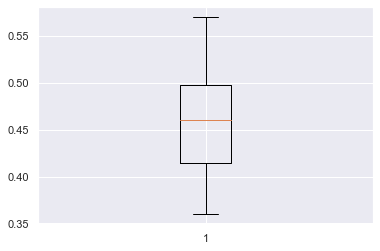

In [54]:
kfold=StratifiedKFold(n_splits=10,shuffle=True,random_state=1)     #Setting number of splits equal to 10
cv_result=cross_val_score(estimator=lr, X=X_train, y=y_train, scoring=scoring, cv=kfold)
print(cv_result.mean() * 100)
#Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result)
plt.show()

There is much room for improvement in our cross-validation score. Our first step will be to transform the data before fitting a logistic model to it. Ridge regularization of these models will also be tested.
### With Transformations
* Note about printouts:
    * "LR" stands for "Linear Regression" and "Ridge" stands for "Ridge Regression".
    * "Std" stands for "StandardScaler" and "Pwr" stands for "PowerTransformer".

LRStd: 57.852041608445894


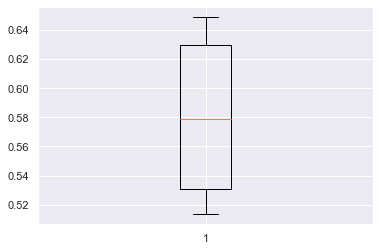

RidgeStd: 47.845831392640896


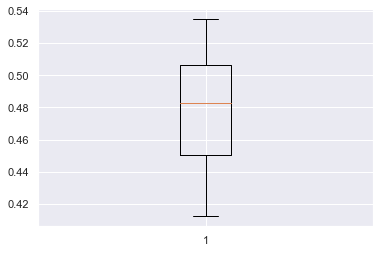

LRPwr: 55.04502406458626


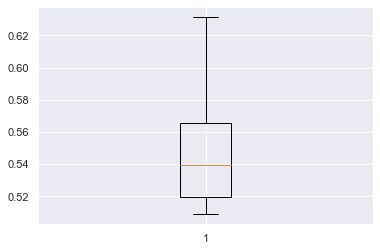

RidgePwr: 45.38270454898307


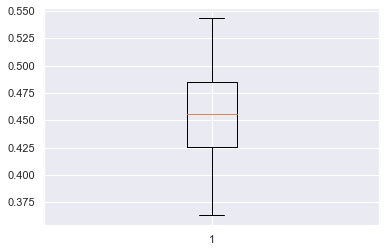

In [55]:
LRmodels = []  # Empty list to store all the models

# Appending pipelines for each model into the list
for t in Transformations:
    LRmodels.append(
        (
            "LR"+t,
            Pipeline(
                steps=[
                    (t+"scaler", Transformations[t]),
                    ("log_reg", LogisticRegression(random_state=1)),
                ]
            ),
        )
    )
    LRmodels.append(
        (
            "Ridge"+t,
            Pipeline(
                steps=[
                    (t+"scaler", Transformations[t]),
                    ("ridge_reg", RidgeClassifier(random_state=1)),
                ]
            ),
        )
    )

LRresults = []  # Empty list to store all model's CV scores
LRnames = []  # Empty list to store name of the models

# loop through all models to get the mean cross validated score
for name, model in LRmodels:
    kfold = StratifiedKFold(
        n_splits=10, shuffle=True, random_state=1
    )  # Setting number of splits equal to 10
    cv_result = cross_val_score(
        estimator=model, X=X_train, y=y_train, scoring=scoring, cv=kfold
    )
    LRresults.append(cv_result)
    LRnames.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))
    plt.boxplot(cv_result)
    plt.show()

Transformations are improving model performance, but Ridge regression seems to making the transformed data perform worse. Various up and down sampling techniques will now be used to improve the model more.
## Oversampling (SMOTE) Model

In [56]:
sm = SMOTE(sampling_strategy = 1 ,k_neighbors = 10, random_state=1)   #Synthetic Minority Over Sampling Technique
X_train_res, y_train_res = sm.fit_resample(X_train, y_train.ravel())
model = LogisticRegression()

SmoteLRStd: 91.44413320883909


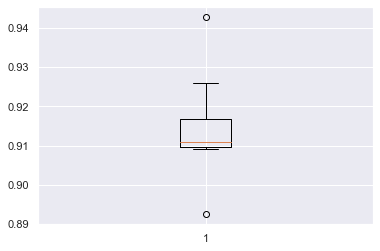

SmoteRidgeStd: 89.78015448603684


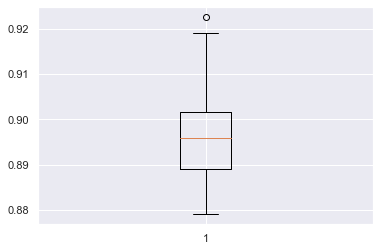

SmoteLRPwr: 89.54477548595194


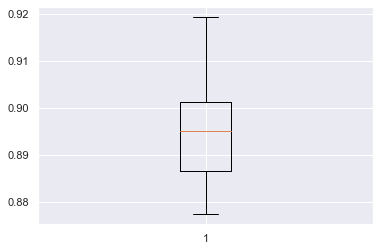

SmoteRidgePwr: 86.98981410746116


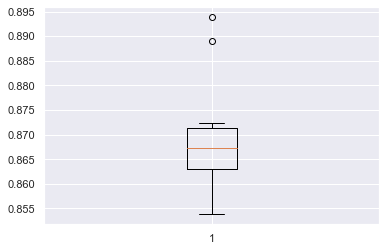

In [57]:
# loop through all models to get the mean cross validated score
for name, model in LRmodels:
    kfold = StratifiedKFold(
        n_splits=10, shuffle=True, random_state=1
    )  # Setting number of splits equal to 10
    cv_result = cross_val_score(
        estimator=model, X=X_train_res, y=y_train_res, scoring=scoring, cv=kfold
    )
    LRresults.append(cv_result)
    LRnames.append("Smote"+name)
    print("{}: {}".format("Smote"+name, cv_result.mean() * 100))
    plt.boxplot(cv_result)
    plt.show()

SMOTE has improved model performance drastically. We will now look at undersampling techniques to see if performance can improve even more.
## Undersampling (RandomUnderSampler) Model

In [58]:
rus = RandomUnderSampler()
X_rus, y_rus = rus.fit_resample(X_train, y_train)
model = LogisticRegression()

RusLRStd: 84.7228691197019


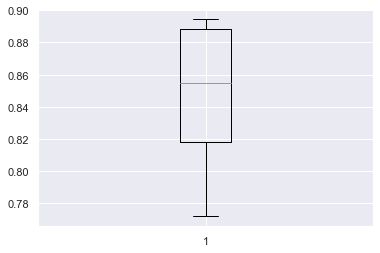

RusRidgeStd: 85.42617605961806


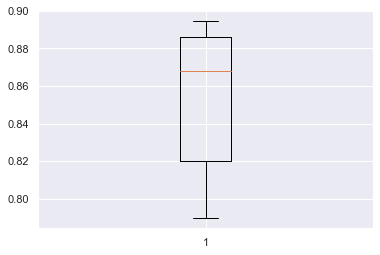

RusLRPwr: 85.6885576773793


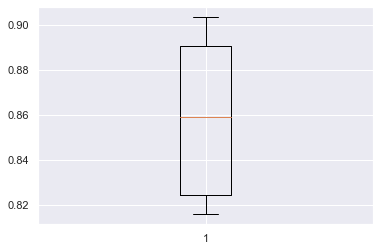

RusRidgePwr: 85.6885576773793


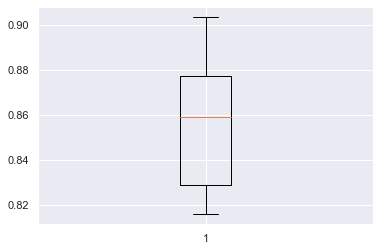

In [59]:
for name, model in LRmodels:
    kfold = StratifiedKFold(
        n_splits=10, shuffle=True, random_state=1
    )  # Setting number of splits equal to 10
    cv_result = cross_val_score(
        estimator=model, X=X_rus, y=y_rus, scoring=scoring, cv=kfold
    )
    LRresults.append(cv_result)
    LRnames.append("Rus"+name)
    print("{}: {}".format("Rus"+name, cv_result.mean() * 100))
    plt.boxplot(cv_result)
    plt.show()

Random undersampling is not performing as well as SMOTE.
## Undersampling (TomekLinks) Model

In [60]:
tl = TomekLinks()
X_tl, y_tl= tl.fit_resample(X_train, y_train)
model = LogisticRegression()

TlLRStd: 60.40444030430058


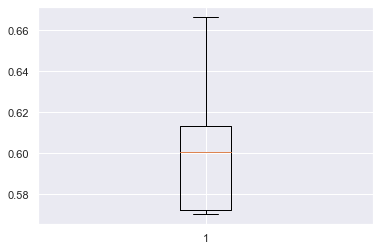

TlRidgeStd: 50.74600217357552


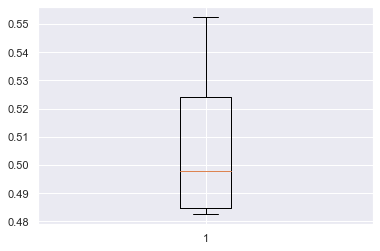

TlLRPwr: 63.119080888060864


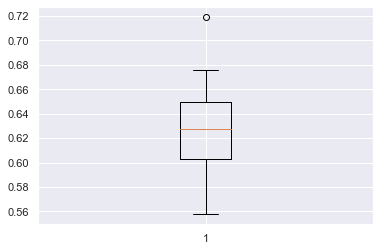

TlRidgePwr: 53.37214718211458


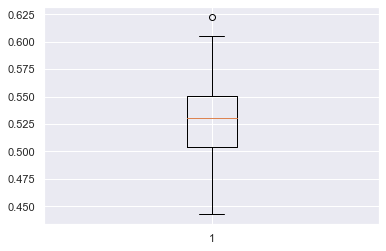

In [61]:
for name, model in LRmodels:
    kfold = StratifiedKFold(
        n_splits=10, shuffle=True, random_state=1
    )  # Setting number of splits equal to 10
    cv_result = cross_val_score(
        estimator=model, X=X_tl, y=y_tl, scoring=scoring, cv=kfold
    )
    LRresults.append(cv_result)
    LRnames.append("Tl"+name)
    print("{}: {}".format("Tl"+name, cv_result.mean() * 100))
    plt.boxplot(cv_result)
    plt.show()

TomekLinks undersampling is not performing too much better than the model without under or over sampling.
## Undersampling (ClusterCentroids) Model

In [62]:
cc = ClusterCentroids()  
X_cc, y_cc = cc.fit_resample(X_train, y_train)
model = LogisticRegression()

CCLRStd: 96.05107902499611


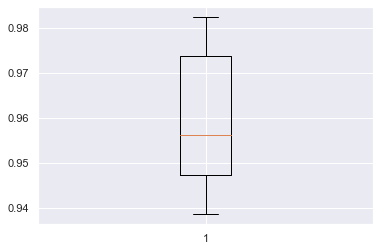

CCRidgeStd: 97.01599130569788


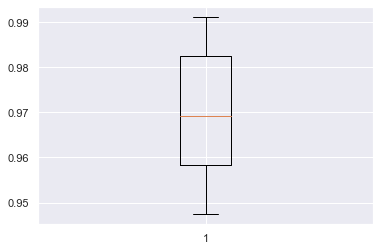

CCLRPwr: 96.57739481446981


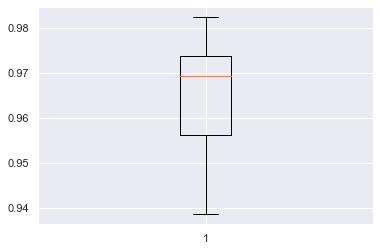

CCRidgePwr: 97.27992547741036


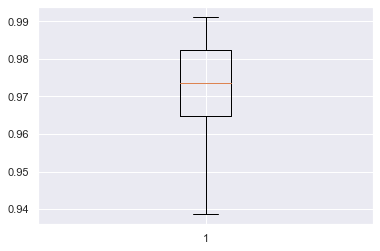

In [63]:
for name, model in LRmodels:
    kfold = StratifiedKFold(
        n_splits=10, shuffle=True, random_state=1
    )  # Setting number of splits equal to 10
    cv_result = cross_val_score(
        estimator=model, X=X_cc, y=y_cc, scoring=scoring, cv=kfold
    )
    LRresults.append(cv_result)
    LRnames.append("CC"+name)
    print("{}: {}".format("CC"+name, cv_result.mean() * 100))
    plt.boxplot(cv_result)
    plt.show()

Cluster Centroids undersampling is performing the best. However, we will try one more technique before making a final decision.
## Upsampling followed by downsampling (SMOTETomek) Model

In [64]:
smt = SMOTETomek(sampling_strategy='auto')
X_smt, y_smt = smt.fit_resample(X_train, y_train)
model = LogisticRegression()

SmtLRStd: 91.24123703921369


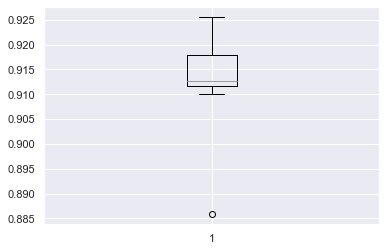

SmtRidgeStd: 89.73514719375363


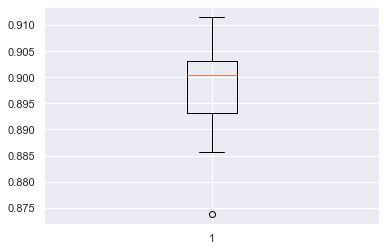

SmtLRPwr: 91.93387825106593


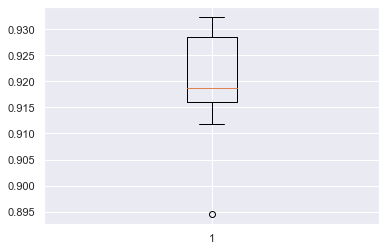

SmtRidgePwr: 89.87388532740042


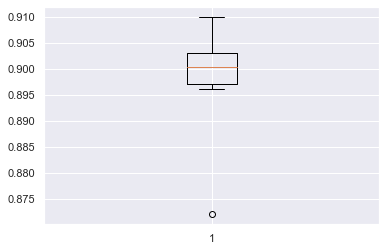

In [65]:
for name, model in LRmodels:
    kfold = StratifiedKFold(
        n_splits=10, shuffle=True, random_state=1
    )  # Setting number of splits equal to 10
    cv_result = cross_val_score(
        estimator=model, X=X_smt, y=y_smt, scoring=scoring, cv=kfold
    )
    LRresults.append(cv_result)
    LRnames.append("Smt"+name)
    print("{}: {}".format("Smt"+name, cv_result.mean() * 100))
    plt.boxplot(cv_result)
    plt.show()

This combination of SMOTE and TomekLinks performs better than both individually, but not as well as Cluster Centroids.
## Final Logistic Model Results

In [66]:
LRResults_Dict = {LRnames[i]: LRresults[i].mean() for i in range(len(LRnames))}
LRResults_Dict

{'LRStd': 0.5785204160844589,
 'RidgeStd': 0.478458313926409,
 'LRPwr': 0.5504502406458626,
 'RidgePwr': 0.4538270454898307,
 'SmoteLRStd': 0.914441332088391,
 'SmoteRidgeStd': 0.8978015448603683,
 'SmoteLRPwr': 0.8954477548595194,
 'SmoteRidgePwr': 0.8698981410746116,
 'RusLRStd': 0.847228691197019,
 'RusRidgeStd': 0.8542617605961806,
 'RusLRPwr': 0.856885576773793,
 'RusRidgePwr': 0.856885576773793,
 'TlLRStd': 0.6040444030430058,
 'TlRidgeStd': 0.5074600217357552,
 'TlLRPwr': 0.6311908088806086,
 'TlRidgePwr': 0.5337214718211458,
 'CCLRStd': 0.9605107902499611,
 'CCRidgeStd': 0.9701599130569788,
 'CCLRPwr': 0.9657739481446981,
 'CCRidgePwr': 0.9727992547741036,
 'SmtLRStd': 0.9124123703921369,
 'SmtRidgeStd': 0.8973514719375364,
 'SmtLRPwr': 0.9193387825106594,
 'SmtRidgePwr': 0.8987388532740042}

Our best logistic regression model by Cross-Validation Score is Ridge Regression with a Power Transformation and Cluster Centroids undersampling. We will now take a look at its performance metrics on both the train and test set, as well as its confusion matrix on the test set, because this is our final logistic regression model.

In [67]:
##  Function to calculate different metric scores of the model - Accuracy, Recall and Precision
def get_metrics_score(model,train,test,train_y,test_y,flag=True):
    '''
    model : classifier to predict values of X

    '''
    # defining an empty list to store train and test results
    score_list=[] 
    
    pred_train = model.predict(train)
    pred_test = model.predict(test)
    
    train_acc = model.score(train,train_y)
    test_acc = model.score(test,test_y)
    
    train_recall = metrics.recall_score(train_y,pred_train)
    test_recall = metrics.recall_score(test_y,pred_test)
    
    train_precision = metrics.precision_score(train_y,pred_train)
    test_precision = metrics.precision_score(test_y,pred_test)
    
    score_list.extend((train_acc,test_acc,train_recall,test_recall,train_precision,test_precision))
        
    # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True: 
        print("Accuracy on training set : ",model.score(train,train_y))
        print("Accuracy on test set : ",model.score(test,test_y))
        print("Recall on training set : ",metrics.recall_score(train_y,pred_train))
        print("Recall on test set : ",metrics.recall_score(test_y,pred_test))
        print("Precision on training set : ",metrics.precision_score(train_y,pred_train))
        print("Precision on test set : ",metrics.precision_score(test_y,pred_test))
    
    return score_list # returning the list with train and test scores

In [68]:
## Function to create confusion matrix
def make_confusion_matrix(model, y_actual, labels=[1, 0]):
    """
    model : classifier to predict values of X
    y_actual : ground truth

    """
    y_predict = model.predict(X_test)
    cm = metrics.confusion_matrix(y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(
        cm,
        index=[i for i in ["Actual - No", "Actual - Yes"]],
        columns=[i for i in ["Predicted - No", "Predicted - Yes"]],
    )
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten() / np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in zip(group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2, 2)
    plt.figure(figsize=(10, 7))
    sns.heatmap(df_cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

Accuracy on training set :  0.9596136962247586
Accuracy on test set :  0.48107930240210595
Recall on training set :  0.974539069359087
Recall on test set :  0.9631147540983607
Precision on training set :  0.9462915601023018
Precision on test set :  0.23164120256283885


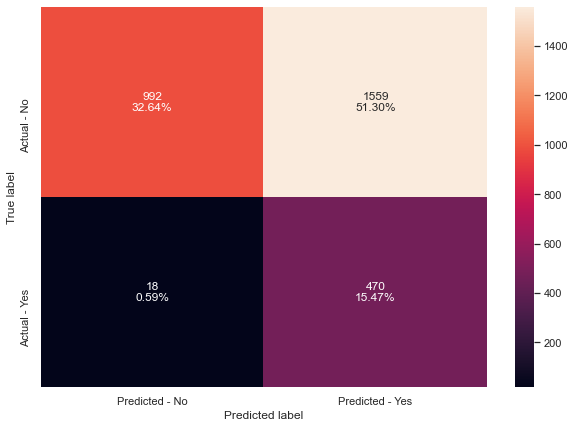

In [69]:
RRPipe = Pipeline(steps=[("Pwrscaler", PowerTransformer()), ("ridge_reg", RidgeClassifier(random_state=1))])
RRPipe.fit(X_cc, y_cc)

#Calculating different metrics
get_metrics_score(RRPipe,X_cc,X_test,y_cc,y_test)


# creating confusion matrix
make_confusion_matrix(RRPipe,y_test)

Overall, while recall on both the train and test sets are extremely high, other performance metrics are much lower and suggest overfitting. This certainly seems to be the case, because almost 70% of test data was predicted to default. This would be a major problem when put into practice, so **this linear regression model should not be put into production".**

Let's see if any Boosting or Bagging models will perform better...
# Bagging and Boosting Models

In [70]:
modeldict = {"DT": DecisionTreeClassifier(random_state=1),
             "RF": RandomForestClassifier(random_state=1),
             "BG": BaggingClassifier(random_state=1),
             "ADB": AdaBoostClassifier(random_state=1),
             "GBM": GradientBoostingClassifier(random_state=1),
             "XGB": XGBClassifier(random_state=1,eval_metric='logloss')}

models = []  # Empty list to store all the models

# Appending pipelines for each model into the list
for m in modeldict:
    models.append((m, make_pipeline(StandardScaler(), modeldict[m]),))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models

# loop through all models to get the mean cross validated score
for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train, y=y_train, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))

DT: 78.31439833062832
RF: 76.56387665198238
BG: 80.95216013602288
ADB: 83.93577556225364
GBM: 82.70731895818842
XGB: 85.95757013679574


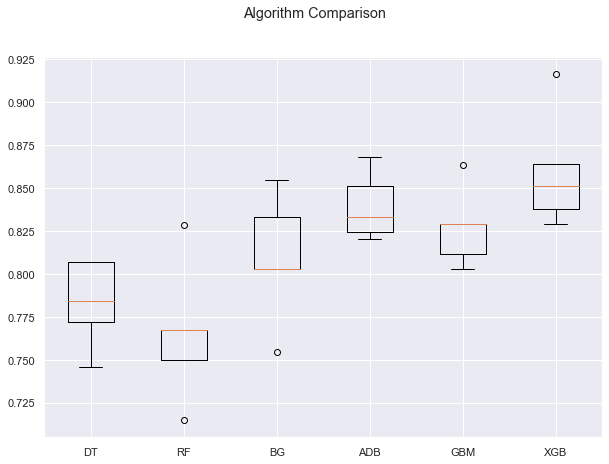

In [71]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure(figsize=(10, 7))

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

The three best models based on average cross-validation scores are our 3 boosting models: Adaboost, Gradient Boosting, and XGBoost. These are the 3 models that we will proceed forward with for hyperparameter tuning.


# Hyperparameter Tuning Using GridSearch

## Adaboost Model

In [72]:
%%time 

# Creating pipeline
pipe = make_pipeline(StandardScaler(), AdaBoostClassifier(random_state=1))

# Parameter grid to pass in GridSearchCV
param_grid = {
    "adaboostclassifier__n_estimators": np.arange(10, 110, 10),
    "adaboostclassifier__learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "adaboostclassifier__base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCV
grid_cv = GridSearchCV(estimator=pipe, param_grid=param_grid, scoring=scorer, cv=5)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

print(
    "Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_)
)

Best Parameters:{'adaboostclassifier__base_estimator': DecisionTreeClassifier(max_depth=3, random_state=1), 'adaboostclassifier__learning_rate': 0.2, 'adaboostclassifier__n_estimators': 100} 
Score: 0.882359533194219
Wall time: 13min 16s


In [103]:
# Creating new pipeline with best parameters
abc_tuned1 = make_pipeline(
    StandardScaler(),
    AdaBoostClassifier(
        base_estimator=DecisionTreeClassifier(max_depth=3, random_state=1),
        n_estimators=100,
        learning_rate=0.2,
        random_state=1,
    ),
)

# Fit the model on training data
abc_tuned1.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('adaboostclassifier',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3,
                                                                          random_state=1),
                                    learning_rate=0.2, n_estimators=100,
                                    random_state=1))])

Accuracy on training set :  0.9928047404063205
Accuracy on test set :  0.9746627179993419
Recall on training set :  0.971027216856892
Recall on test set :  0.9036885245901639
Precision on training set :  0.9839857651245552
Precision on test set :  0.9363057324840764


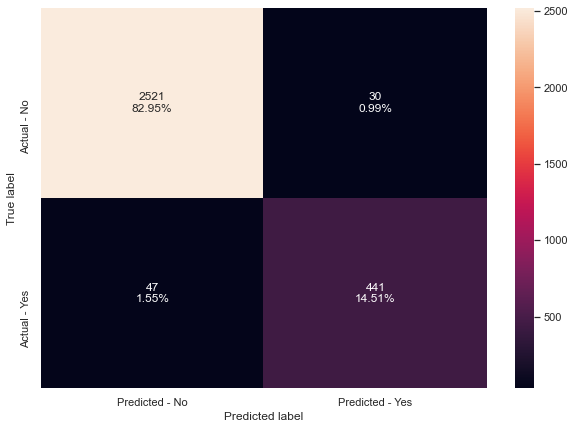

In [96]:
# Calculating different metrics
get_metrics_score(abc_tuned1,X_train,X_test,y_train,y_test)

# Creating confusion matrix
make_confusion_matrix(abc_tuned1,y_test)

## Gradient Boosting Model

In [75]:
%%time 

# Creating pipeline
pipe = make_pipeline(StandardScaler(), GradientBoostingClassifier(random_state=1))

# Parameter grid to pass in GridSearchCV
param_grid = {
    "gradientboostingclassifier__n_estimators": np.arange(10, 110, 10),
    "gradientboostingclassifier__learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "gradientboostingclassifier__min_samples_split": np.arange(2, 11, 5),
    'gradientboostingclassifier__min_impurity_decrease': [0.01,.001]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCV
grid_cv = GridSearchCV(estimator=pipe, param_grid=param_grid, scoring=scorer, cv=5)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

print(
    "Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_)
)

Best Parameters:{'gradientboostingclassifier__learning_rate': 0.2, 'gradientboostingclassifier__min_impurity_decrease': 0.001, 'gradientboostingclassifier__min_samples_split': 2, 'gradientboostingclassifier__n_estimators': 100} 
Score: 0.8709482958497565
Wall time: 18min 55s


In [97]:
# Creating new pipeline with best parameters
gbm_tuned1 = make_pipeline(
    StandardScaler(),
    GradientBoostingClassifier(
        n_estimators=100,
        learning_rate=0.2,
        min_samples_split=2,
        min_impurity_decrease=0.001,
        random_state=1,
    ),
)

# Fit the model on training data
gbm_tuned1.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingclassifier',
                 GradientBoostingClassifier(learning_rate=0.2,
                                            min_impurity_decrease=0.001,
                                            random_state=1))])

Accuracy on training set :  0.9860327313769752
Accuracy on test set :  0.9743336623889437
Recall on training set :  0.9429323968393327
Recall on test set :  0.889344262295082
Precision on training set :  0.9693140794223827
Precision on test set :  0.9475982532751092


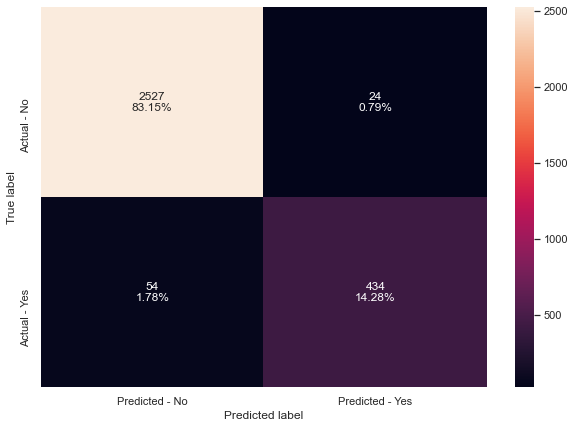

In [98]:
# Calculating different metrics
get_metrics_score(gbm_tuned1,X_train,X_test,y_train,y_test)

# Creating confusion matrix
make_confusion_matrix(gbm_tuned1, y_test)

## XGBoost Model

In [78]:
%%time 

#Creating pipeline
pipe=make_pipeline(StandardScaler(), XGBClassifier(random_state=1,eval_metric='logloss'))

#Parameter grid to pass in GridSearchCV
param_grid={'xgbclassifier__n_estimators':np.arange(50,151,50),'xgbclassifier__scale_pos_weight':[0,1,5,10],
            'xgbclassifier__learning_rate':[0.01,0.1,0.2], 'xgbclassifier__gamma':[0,1,3,5]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling GridSearchCV
grid_cv = GridSearchCV(estimator=pipe, param_grid=param_grid, scoring=scorer, cv=5)

#Fitting parameters in GridSeachCV
grid_cv.fit(X_train,y_train)


print("Best parameters are {} with CV score={}:" .format(grid_cv.best_params_,grid_cv.best_score_))

Best parameters are {'xgbclassifier__gamma': 3, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__n_estimators': 50, 'xgbclassifier__scale_pos_weight': 10} with CV score=0.9499613571373369:
Wall time: 13min 36s


In [99]:
# Creating new pipeline with best parameters
xgb_tuned1 = make_pipeline(
    StandardScaler(),
    XGBClassifier(
        random_state=1,
        n_estimators=50,
        scale_pos_weight=10,
        learning_rate=0.1,
        gamma=3,
        eval_metric='logloss',
    ),
)

# Fit the model on training data
xgb_tuned1.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('xgbclassifier',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, eval_metric='logloss',
                               gamma=3, gpu_id=-1, importance_type='gain',
                               interaction_constraints='', learning_rate=0.1,
                               max_delta_step=0, max_depth=6,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=50,
                               n_jobs=4, num_parallel_tree=1, random_state=1,
                               reg_alpha=0, reg_lambda=1, scale_pos_weight=10,
                               subsample=1, tree_method='exact',
                               validate_parameters=1, verbosity=None))])

Accuracy on training set :  0.9720654627539503
Accuracy on test set :  0.9532741033234616
Recall on training set :  1.0
Recall on test set :  0.9508196721311475
Precision on training set :  0.8519072550486163
Precision on test set :  0.7972508591065293


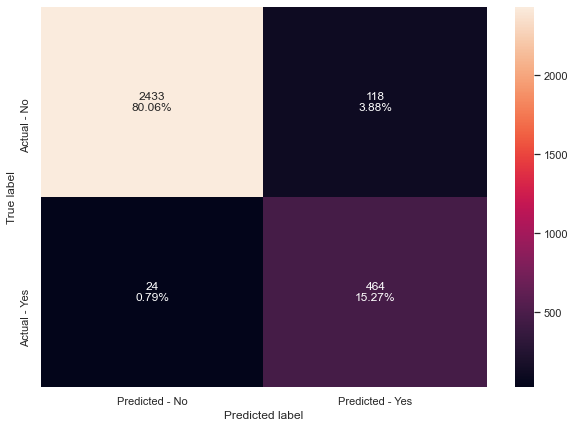

In [100]:
# Calculating different metrics
get_metrics_score(xgb_tuned1,X_train,X_test,y_train,y_test)

# Creating confusion matrix
make_confusion_matrix(xgb_tuned1, y_test)

# Hyperparameter Tuning Using RandomSearch
## Adaboost Model

In [81]:
%%time

# Creating pipeline
pipe = make_pipeline(StandardScaler(), AdaBoostClassifier(random_state=1))

# Parameter grid to pass in GridSearchCV
param_grid = {
    "adaboostclassifier__n_estimators": np.arange(10, 110, 10),
    "adaboostclassifier__learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "adaboostclassifier__base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}
# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
abc_tuned2 = RandomizedSearchCV(estimator=pipe, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
abc_tuned2.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(abc_tuned2.best_params_,abc_tuned2.best_score_))

Best parameters are {'adaboostclassifier__n_estimators': 90, 'adaboostclassifier__learning_rate': 0.2, 'adaboostclassifier__base_estimator': DecisionTreeClassifier(max_depth=3, random_state=1)} with CV score=0.8806090115155731:
Wall time: 4min 39s


In [101]:
# Creating new pipeline with best parameters
abc_tuned2 = make_pipeline(
    StandardScaler(),
    AdaBoostClassifier(
        base_estimator=DecisionTreeClassifier(max_depth=2, random_state=1),
        n_estimators=90,
        learning_rate=1,
        random_state=1,
    ),
)

# Fit the model on training data
abc_tuned2.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('adaboostclassifier',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=2,
                                                                          random_state=1),
                                    learning_rate=1, n_estimators=90,
                                    random_state=1))])

Accuracy on training set :  0.9933690744920993
Accuracy on test set :  0.9700559394537677
Recall on training set :  0.9771729587357331
Recall on test set :  0.8995901639344263
Precision on training set :  0.9814814814814815
Precision on test set :  0.9126819126819127


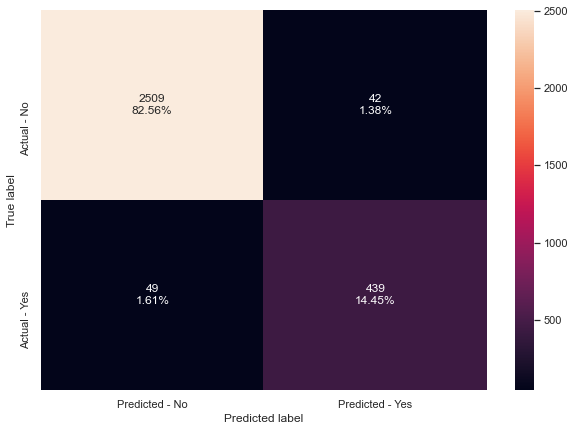

In [102]:
# Calculating different metrics
get_metrics_score(abc_tuned2,X_train,X_test,y_train,y_test)

# Creating confusion matrix
make_confusion_matrix(abc_tuned2, y_test)

## Gradient Boosting Model

In [84]:
%%time 

# Creating pipeline
pipe = make_pipeline(StandardScaler(), GradientBoostingClassifier(random_state=1))

# Parameter grid to pass in GridSearchCV
param_grid = {
    "gradientboostingclassifier__n_estimators": np.arange(70, 110, 10),
    "gradientboostingclassifier__learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "gradientboostingclassifier__min_samples_split": np.arange(2, 11, 5),
    'gradientboostingclassifier__min_impurity_decrease': [0.01,.001]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
gbm_tuned2 = RandomizedSearchCV(estimator=pipe, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1)
# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

print(
    "Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_)
)

Best Parameters:{'xgbclassifier__gamma': 3, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__n_estimators': 50, 'xgbclassifier__scale_pos_weight': 10} 
Score: 0.9499613571373369
Wall time: 13min 37s


In [104]:
# Creating new pipeline with best parameters
gbm_tuned2 = make_pipeline(
    StandardScaler(),
    GradientBoostingClassifier(
        n_estimators=100,
        learning_rate=0.2,
        min_samples_split=2,
        min_impurity_decrease=0.01,
        random_state=1,
    ),
)

# Fit the model on training data
gbm_tuned2.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingclassifier',
                 GradientBoostingClassifier(learning_rate=0.2,
                                            min_impurity_decrease=0.01,
                                            random_state=1))])

Accuracy on training set :  0.9860327313769752
Accuracy on test set :  0.9743336623889437
Recall on training set :  0.9429323968393327
Recall on test set :  0.889344262295082
Precision on training set :  0.9693140794223827
Precision on test set :  0.9475982532751092


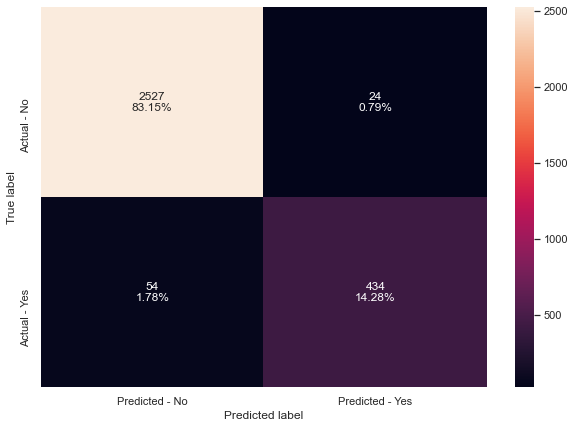

In [105]:
# Calculating different metrics
get_metrics_score(gbm_tuned2,X_train,X_test,y_train,y_test)

# Creating confusion matrix
make_confusion_matrix(gbm_tuned2, y_test)

## XGBoost Model

In [87]:
%%time 

#Creating pipeline
pipe=make_pipeline(StandardScaler(),XGBClassifier(random_state=1,eval_metric='logloss', n_estimators = 50))

#Parameter grid to pass in GridSearchCV
param_grid={'xgbclassifier__n_estimators':np.arange(50,300,50),
            'xgbclassifier__scale_pos_weight':[0,1,2,5,10],
            'xgbclassifier__learning_rate':[0.01,0.1,0.2,0.05],
            'xgbclassifier__gamma':[0,1,3,5],
            'xgbclassifier__subsample':[0.7,0.8,0.9,1],
           'xgbclassifier__max_depth':np.arange(1,10,1),
            'xgbclassifier__reg_lambda':[0,1,2,5,10]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=pipe, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'xgbclassifier__subsample': 0.8, 'xgbclassifier__scale_pos_weight': 10, 'xgbclassifier__reg_lambda': 10, 'xgbclassifier__n_estimators': 100, 'xgbclassifier__max_depth': 2, 'xgbclassifier__learning_rate': 0.2, 'xgbclassifier__gamma': 5} with CV score=0.9692750598964371:
Wall time: 5min 53s


In [106]:
# Creating new pipeline with best parameters
xgb_tuned2 = Pipeline(
    steps=[
        ("scaler", StandardScaler()),
        (
            "XGB",
            XGBClassifier(
                random_state=1,
                n_estimators=250,
                scale_pos_weight=10,
                gamma=5,
                subsample=.8,
                learning_rate= 0.2,
                eval_metric='logloss',
                max_depth = 2,
                reg_lambda = 10
            ),
        ),
    ]
)
# Fit the model on training data
xgb_tuned2.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('XGB',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, eval_metric='logloss',
                               gamma=5, gpu_id=-1, importance_type='gain',
                               interaction_constraints='', learning_rate=0.2,
                               max_delta_step=0, max_depth=2,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=250,
                               n_jobs=4, num_parallel_tree=1, random_state=1,
                               reg_alpha=0, reg_lambda=10, scale_pos_weight=10,
                               subsample=0.8, tree_method='exact',
                               validate_parameters=1, verbosity=None))])

Accuracy on training set :  0.9626128668171557
Accuracy on test set :  0.9493254359986838
Recall on training set :  0.9956101843722563
Recall on test set :  0.9672131147540983
Precision on training set :  0.8134863701578192
Precision on test set :  0.7737704918032787


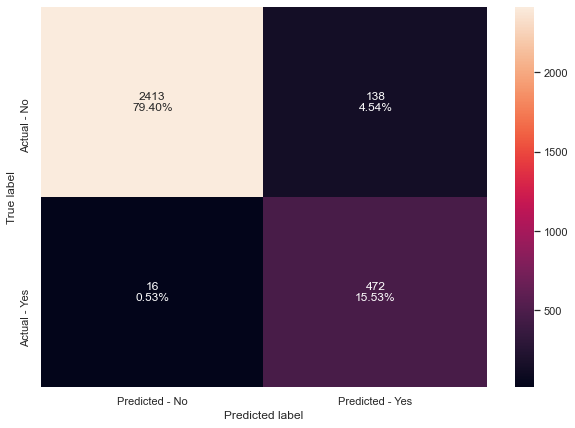

In [107]:
# Calculating different metrics
get_metrics_score(xgb_tuned2,X_train,X_test,y_train,y_test)

# Creating confusion matrix
make_confusion_matrix(xgb_tuned2, y_test)

# Model Performances

In [109]:
# defining list of models
models = [abc_tuned1, abc_tuned2, gbm_tuned1, gbm_tuned2, xgb_tuned1, xgb_tuned2]

# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:

    j = get_metrics_score(model,X_train,X_test,y_train,y_test,False)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])

In [110]:
comparison_frame = pd.DataFrame(
    {
        "Model": [
            "AdaBoost with GridSearchCV",
            "AdaBoost with RandomizedSearchCV",
            "Gradient Boosting Model with GridSearchCV",
            "Gradient with RandomizedSearchCV",
            "XGBoost with GridSearchCV",
            "XGBoost with RandomizedSearchCV",
    
        ],
        "Train_Accuracy": acc_train,
        "Test_Accuracy": acc_test,
        "Train_Recall": recall_train,
        "Test_Recall": recall_test,
        "Train_Precision": precision_train,
        "Test_Precision": precision_test
    }
)

# Sorting models in decreasing order of test recall
comparison_frame.sort_values(by="Test_Recall", ascending=False)

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision
5,XGBoost with RandomizedSearchCV,0.962613,0.949325,0.995610,0.967213,0.813486,0.773770
4,XGBoost with GridSearchCV,0.972065,0.953274,1.000000,0.950820,0.851907,0.797251
0,AdaBoost with GridSearchCV,0.992805,0.974663,0.971027,0.903689,0.983986,0.936306
1,AdaBoost with RandomizedSearchCV,0.993369,0.970056,0.977173,0.899590,0.981481,0.912682
2,Gradient Boosting Model with GridSearchCV,0.986033,0.974334,0.942932,0.889344,0.969314,0.947598
3,Gradient with RandomizedSearchCV,0.986033,0.974334,0.942932,0.889344,0.969314,0.947598


Overall, hyperparameter tuning definitely helped increase the performances of all models. On this set, GridSearch generally performed slightly better than RandomSearch, but this was because (except for gradient boosting) the same parameters were used for both. RandomSearch, however, was able to take minutes off of the computing time, so it may be worth the tradeoff, especially if RandomSearch is used to search a larger hyperparameter space than GridSearch for similar or less computation time.

The XGBoost model tuned with RandomizedSearch has the best recall, is strong in all performance metrics, and does not overfit.

Therefore, **the final model model to be put into production will be XGBoost tuned with RandomizedSearch.**
* This model predicts that 20.07% of customers will attrit.
* It is good enough to put into production!

Lastly, let's take a look at the feature importances of this model:

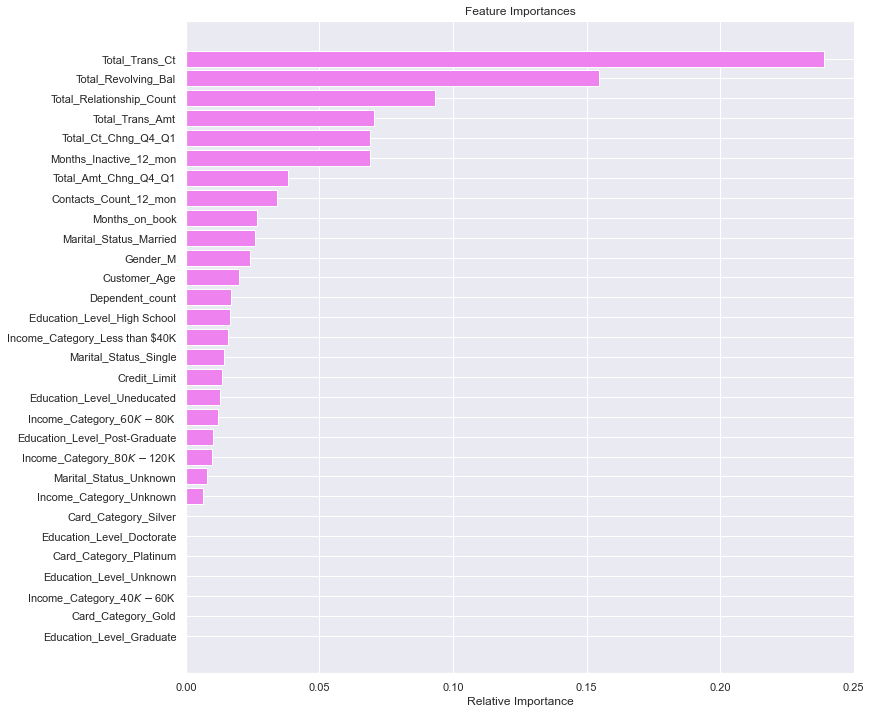

In [111]:
feature_names = X_train.columns
importances = xgb_tuned2[1].feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

Total transaction count is by far the most important feature in this dataset. EDA made it clear that customers with a lower amount of transactions in the past year were more likely to attrit.

Total Revolving Balance, Total Relationship Count, Total Transaction Amount, change in transaction count from Q1 to Q4, and number of months inactive in the last year are the next most important features.
# Insights and Recommendations
1. Put the model we have developed into production.
    * It has performed very well and be confidently used to predict customer attrition.


2. Gather data on more variables.
    * The histogram of Total Transaction Amount consisted of multiple distributions that could not be explained by the current variables. Finding a variable to explain these distributions could provide much insight into customers and their spending habits.


3. Almost all customers own a card from the Blue Category. There is much room for these other card categories to grow.
    * The bivariate analysis provides insights into the relationships between Card_Category and other variables if Thera bank wishes to grow the other card categories.


    
4. Develop a better understanding of this dataset.
    * A lot of curious questions about the behavior of the data, such as bumps at extreme values, missing value imputation, and an unusually large amount of customers having a relationship with the bank of exactly 36 months suggests that this data was handled by someone before this current analysis. Some relationships between variables also raised interest, such as that between months_on_book and customer age, so more domain expertise may be useful in better understanding this data set.



5. Provide incentives to increase spending. Customers are using their credit cards less frequently.
    * This could be a bigger problem for Thera Bank than even attrition. Perhaps some rewards programs or something similar will encourage customers to use their credit cards more.